In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from multiprocessing import Pool
import matplotlib
import scipy.stats as ss
import armine
import networkx as nx
import hashlib
from akapriori import apriori
#import mpld3
#ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# read all tables
aisles = pd.read_csv("aisles.csv")
departments = pd.read_csv("departments.csv")
orders = pd.read_csv("orders.csv")
products = pd.read_csv("products.csv")
order_products_prior= pd.read_csv("order_products__prior.csv")
order_products_train= pd.read_csv("order_products__train.csv")

In [3]:
#Checking Data Frame - Aisle
print(aisles.shape)
aisles.head()

(134, 2)


,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


In [4]:
#Checking Data Frame - Departments
print(departments.shape)
departments.head()

(21, 2)


,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


In [5]:
#Checking Data Frame - Orders
print(orders.shape)
orders.head()

(3421083, 7)


,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.0
2,473747,1,prior,3,3,12,21.0
3,2254736,1,prior,4,4,7,29.0
4,431534,1,prior,5,4,15,28.0


In [6]:
#Checking Data Frame - Product
print(products.shape)
products.head()

(49688, 4)


,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


In [7]:
#Checking Data Frame - order_products_prior
print(order_products_prior.shape)
order_products_prior.head()

(32434489, 4)


,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0


In [8]:
#Checking Data Frame - order_products_train
print(order_products_train.shape)
order_products_train.head()

(1384617, 4)


,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
1,1,11109,2,1
2,1,10246,3,0
3,1,49683,4,0
4,1,43633,5,1


In [9]:
# Join all tables to market_basketframe
concat = pd.concat([order_products_prior, order_products_train], axis = 0)
market_basket_all = pd.merge(orders, concat, on = 'order_id', how = 'left')
market_basket_all = pd.merge(market_basket_all, products, on = 'product_id', how = 'left')
market_basket_all = pd.merge(market_basket_all, aisles, on = 'aisle_id', how = 'left')
market_basket_all = pd.merge(market_basket_all,departments, on = 'department_id', how = 'left')

In [10]:
print(market_basket_all.shape)
market_basket_all.head()

(33894106, 15)


,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,department
0,2539329,1,prior,1,2,8,NaN,196.0,1.0,0.0,Soda,77.0,7.0,soft drinks,beverages
1,2539329,1,prior,1,2,8,NaN,14084.0,2.0,0.0,Organic Unsweetened Vanilla Almond Milk,91.0,16.0,soy lactosefree,dairy eggs
2,2539329,1,prior,1,2,8,NaN,12427.0,3.0,0.0,Original Beef Jerky,23.0,19.0,popcorn jerky,snacks
3,2539329,1,prior,1,2,8,NaN,26088.0,4.0,0.0,Aged White Cheddar Popcorn,23.0,19.0,popcorn jerky,snacks
4,2539329,1,prior,1,2,8,NaN,26405.0,5.0,0.0,XL Pick-A-Size Paper Towel Rolls,54.0,17.0,paper goods,household


# Data Cleaning

In [11]:
market_basket_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33894106 entries, 0 to 33894105
Data columns (total 15 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   order_id                int64  
 1   user_id                 int64  
 2   eval_set                object 
 3   order_number            int64  
 4   order_dow               int64  
 5   order_hour_of_day       int64  
 6   days_since_prior_order  float64
 7   product_id              float64
 8   add_to_cart_order       float64
 9   reordered               float64
 10  product_name            object 
 11  aisle_id                float64
 12  department_id           float64
 13  aisle                   object 
 14  department              object 
dtypes: float64(6), int64(5), object(4)
memory usage: 4.0+ GB


In [12]:
# Check null values
# Since the prior, train, test data have been merged together, only days_since_prior_order null values will be considered. 
# Other features here with 75000 null values mean that they represent the test dataset and need future prediction.
market_basket_all.isnull().sum()

order_id                        0
user_id                         0
eval_set                        0
order_number                    0
order_dow                       0
order_hour_of_day               0
days_since_prior_order    2078068
product_id                  75000
add_to_cart_order           75000
reordered                   75000
product_name                75000
aisle_id                    75000
department_id               75000
aisle                       75000
department                  75000
dtype: int64

In [13]:
# Fill null values for days_since_prior_order, null values mean that the order is the first order
market_basket_all['days_since_prior_order'] = market_basket_all['days_since_prior_order'].fillna(-1)

In [14]:
market_basket_all.head()

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,department
0,2539329,1,prior,1,2,8,-1.0,196.0,1.0,0.0,Soda,77.0,7.0,soft drinks,beverages
1,2539329,1,prior,1,2,8,-1.0,14084.0,2.0,0.0,Organic Unsweetened Vanilla Almond Milk,91.0,16.0,soy lactosefree,dairy eggs
2,2539329,1,prior,1,2,8,-1.0,12427.0,3.0,0.0,Original Beef Jerky,23.0,19.0,popcorn jerky,snacks
3,2539329,1,prior,1,2,8,-1.0,26088.0,4.0,0.0,Aged White Cheddar Popcorn,23.0,19.0,popcorn jerky,snacks
4,2539329,1,prior,1,2,8,-1.0,26405.0,5.0,0.0,XL Pick-A-Size Paper Towel Rolls,54.0,17.0,paper goods,household


In [15]:
# Count number of duplicates
sum(market_basket_all.duplicated())

0

In [16]:
#converting number of day to name
market_basket_all["order_dow"] = market_basket_all["order_dow"].apply(lambda x:"Saturday" if x==0 else x)
market_basket_all["order_dow"] = market_basket_all["order_dow"].apply(lambda x:"Sunday" if x==1 else x)
market_basket_all["order_dow"] = market_basket_all["order_dow"].apply(lambda x:"Monday" if x==2 else x)
market_basket_all["order_dow"] = market_basket_all["order_dow"].apply(lambda x:"Tuesday" if x==3 else x)
market_basket_all["order_dow"] = market_basket_all["order_dow"].apply(lambda x:"Wednesday" if x==4 else x)
market_basket_all["order_dow"] = market_basket_all["order_dow"].apply(lambda x:"Thursday" if x==5 else x)
market_basket_all["order_dow"] = market_basket_all["order_dow"].apply(lambda x:"Friday" if x==6 else x)

In [18]:
#Saving result data frame as a csv File
# market_basket_all.to_csv("MarketBasket.csv")

In [3]:
#Reading market basket initial from csv File as a data frame
# market_basket_all = pd.read_csv("MarketBasket.csv")

# Exploratory Data Analysis

In [17]:
# Selecting prior dataset from the whole dataset
market_basket = market_basket_all[market_basket_all['eval_set'] ==  'prior']

## Department Aisle Product

In [19]:
# number of products in departments/aisles
eda7 = market_basket[['product_name', 'aisle', 'department']].drop_duplicates().groupby(['aisle', 'department']).count()
eda7 = eda7.rename(columns = {'product_name':'count'}).reset_index()
fig = px.treemap(eda7, path = ['department', 'aisle', 'count'], values = 'count')
fig.update_layout(
    uniformtext=dict(minsize = 30),
    margin = dict(t=0, l=0, r=0, b=0)
)
fig.show()

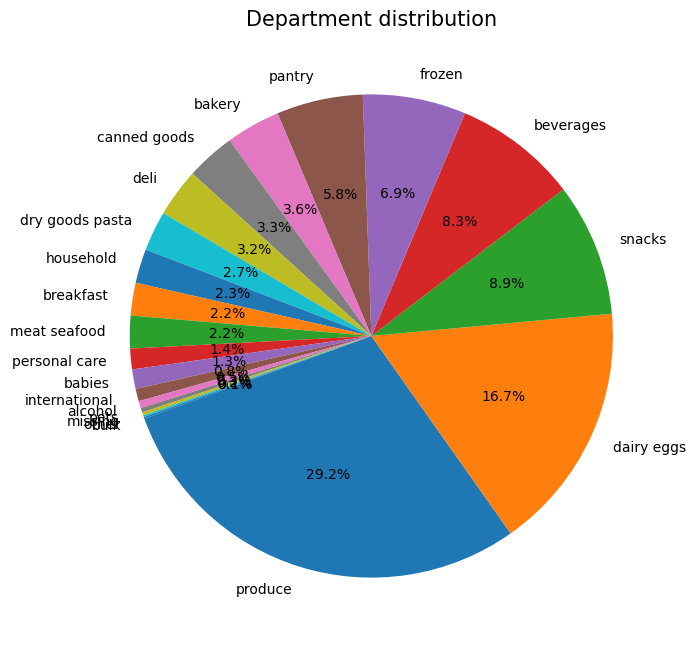

In [20]:
## Department distribution
plt.figure(figsize=(15,8), dpi=100)
temp_series = market_basket['department'].value_counts()
labels = (np.array(temp_series.index))
sizes = (np.array(temp_series/temp_series.sum())*100)
plt.pie(sizes,labels = labels, autopct='%1.1f%%',startangle=200)
plt.title("Department distribution",fontsize=15)
plt.show()

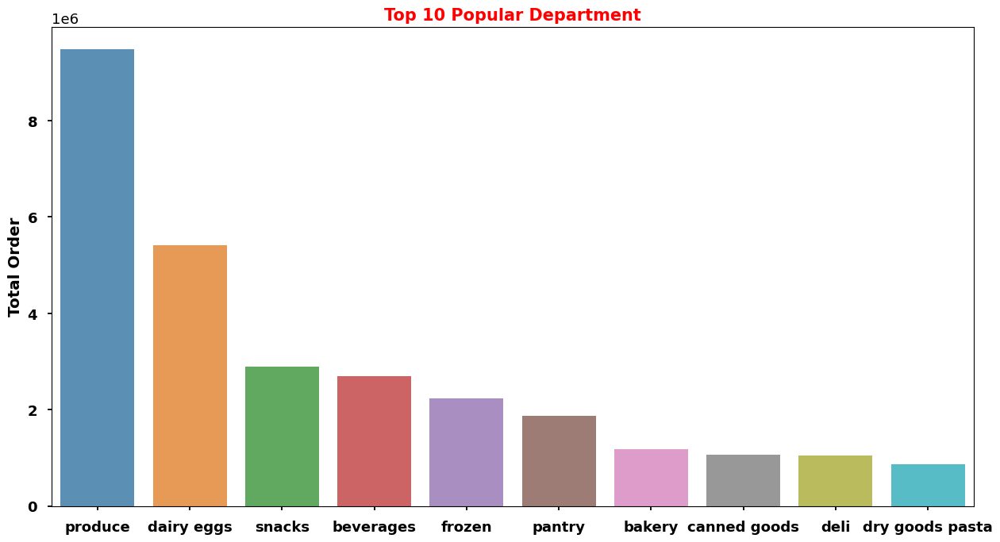

In [21]:
# Most Popular Departments (Top 10)
plt.figure(figsize=(15,8),dpi = 100)
plt.style.use('seaborn-talk')
popular_department = market_basket['department'].value_counts().head(10)
sns.barplot(popular_department.index, popular_department.values, alpha=0.8)
plt.title("Top 10 Popular Department", weight="bold", c="red",fontsize=15)
plt.xlabel("")
plt.ylabel("Total Order",weight= "bold")
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

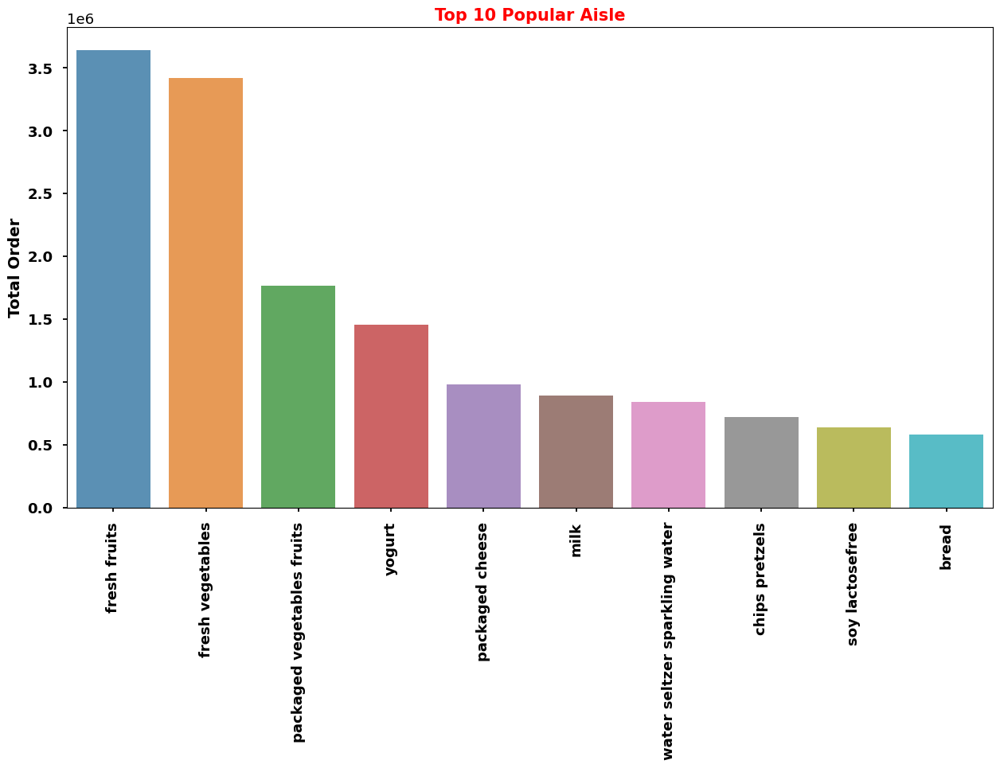

In [22]:
# Most Popular Aisle (Top 10)
plt.figure(figsize=(15,8),dpi=100),
plt.style.use('seaborn-talk')
popular_aisle = market_basket['aisle'].value_counts().head(10)
sns.barplot(popular_aisle.index, popular_aisle.values, alpha=0.8)
plt.xticks(rotation='vertical')
plt.title("Top 10 Popular Aisle", weight="bold", c="red",fontsize=15)
plt.xlabel("")
plt.ylabel("Total Order",weight= "bold")
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

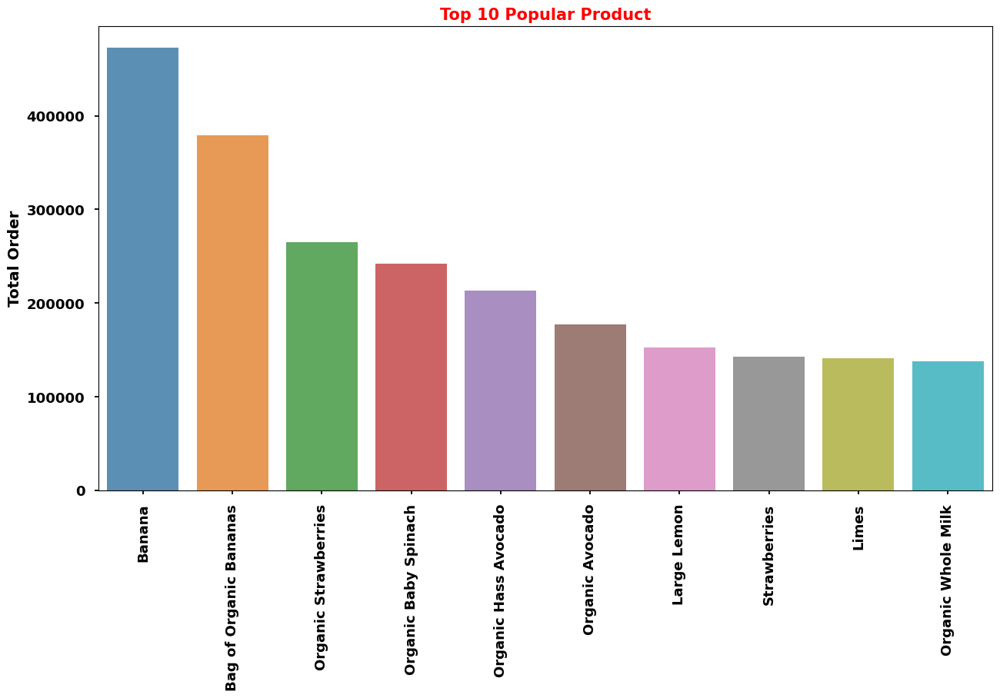

In [23]:
# Most Popular Product (Top 10)
plt.figure(figsize=(15,8),dpi=100),
plt.style.use('seaborn-talk')
popular_product = market_basket['product_name'].value_counts().head(10)
sns.barplot(popular_product.index, popular_product.values, alpha=0.8)
plt.xticks(rotation='vertical')
plt.title("Top 10 Popular Product", weight="bold", c="red",fontsize=15)
plt.xlabel("")
plt.ylabel("Total Order",weight= "bold")
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

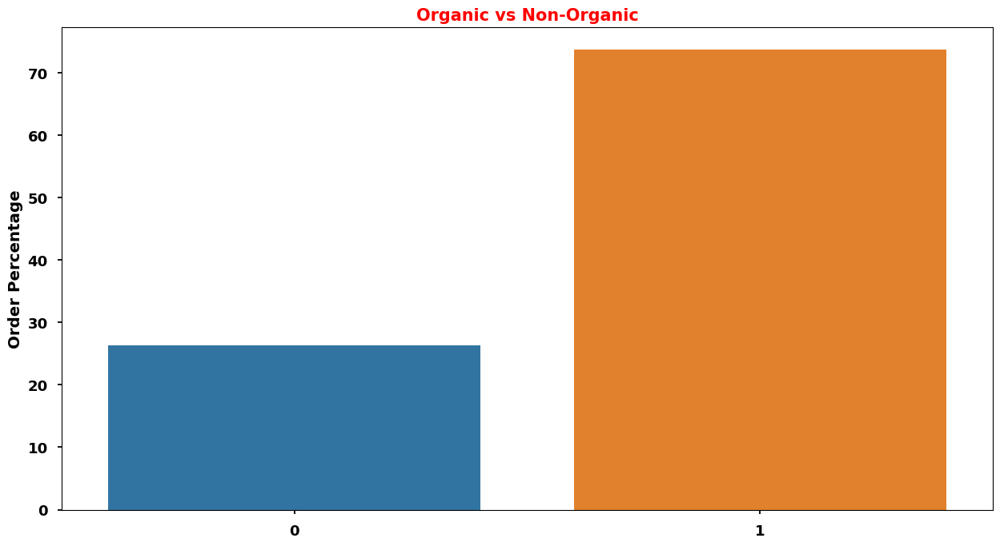

In [24]:
# Buy organic or non-organic
plt.figure(figsize=(15,8),dpi=100)
market_basket['organic'] = market_basket.product_name.str.contains('Organic').astype(np.int8)
org = market_basket.groupby('order_id')['organic'].aggregate("max").value_counts()
sns.barplot(org.index, org / org.sum() * 100)
plt.title("Organic vs Non-Organic", weight="bold", c="red",fontsize=15)
plt.xlabel("")
plt.ylabel("Order Percentage",weight= "bold")
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

## Order Frequency related to time dimension

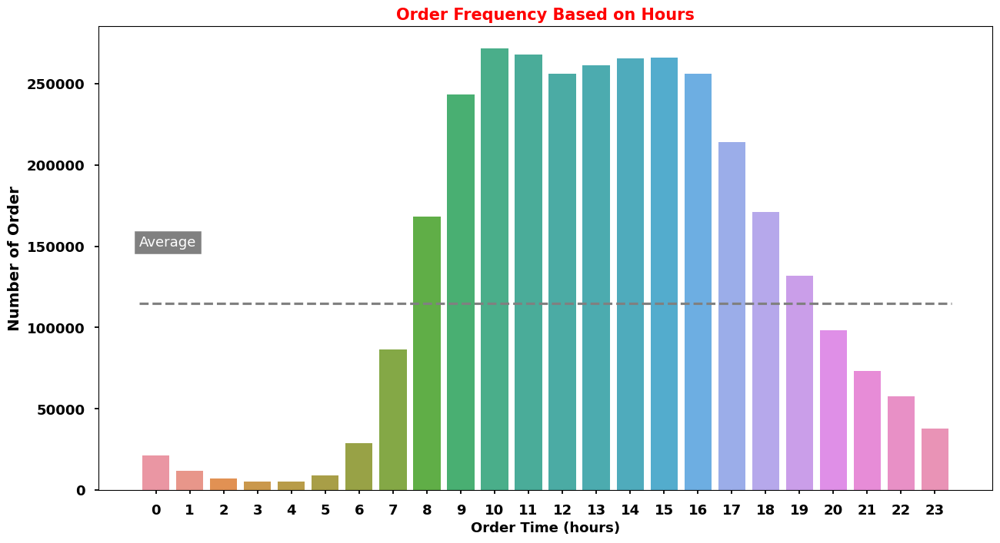

In [25]:
# Frequency or Order Based on Hours
fig, ax = plt.subplots(figsize=(15,8), dpi = 100)
order_hours = market_basket[['order_id', 'order_hour_of_day']].drop_duplicates()
ax = sns.countplot(x = 'order_hour_of_day', data = order_hours)
plt.title("Order Frequency Based on Hours", weight="bold", c="red",fontsize=15)
plt.ylabel("Number of Order",weight= "bold")
plt.xlabel('Order Time (hours)', fontsize=13, weight="bold")
x_coordinates = [-0.5, 23.5]
avg = market_basket[['order_id', 'order_hour_of_day']].drop_duplicates().groupby(["order_hour_of_day"])['order_id'].count().median()
y_avg = [avg, avg]
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.text(-0.5,150000,'Average',fontsize = 13,backgroundcolor = 'gray',color = 'white')
plt.plot(x_coordinates, y_avg,linestyle = '--', c="gray")
plt.show()

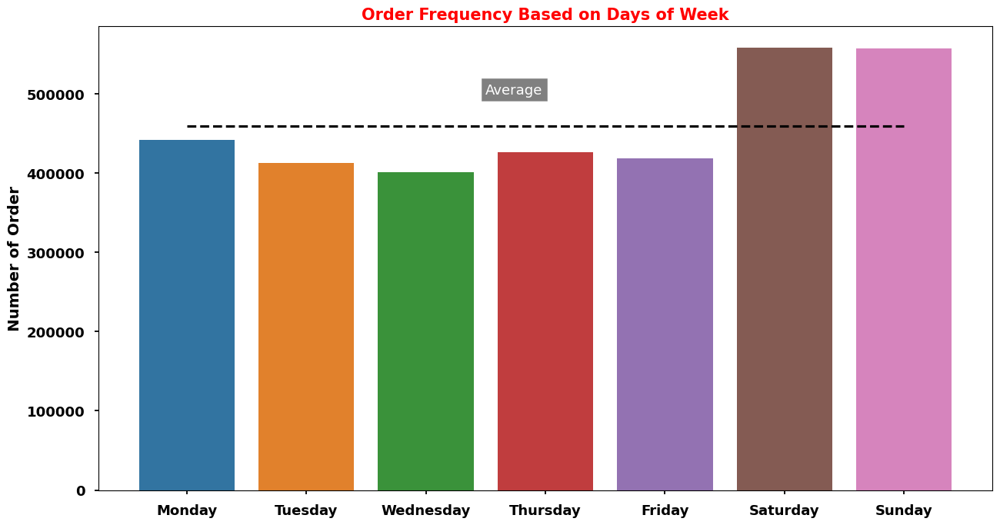

In [26]:
# Frequency of Order Based on Days

dow = market_basket[['order_id', 'order_dow']].drop_duplicates()

plt.figure(figsize=(15,8),dpi=100),
plt.style.use('seaborn-talk')
ax = sns.countplot(x="order_dow",data=dow,order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"])
plt.title("Order Frequency Based on Days of Week", weight="bold", c="red",fontsize=15)
plt.xlabel("")
plt.ylabel("Number of Order",weight= "bold")
plt.yticks(weight="bold")
plt.xticks(weight="bold")
x_coordinates = [0, 6]
avg = market_basket[['order_id', 'order_dow']].drop_duplicates().groupby(["order_dow"])['order_id'].count().mean()
y_avg = [avg, avg]
plt.text(2.5,500000,'Average',fontsize = 13,backgroundcolor = 'gray',color = 'white')
plt.plot(x_coordinates, y_avg, linestyle = '--', c="black")
plt.show()

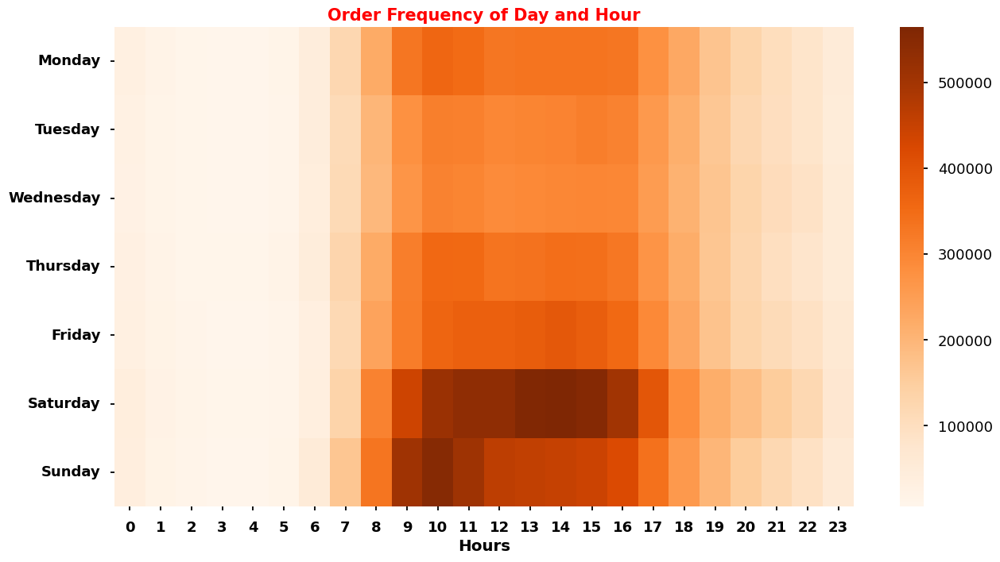

In [27]:
# Heatmap of Frequency or Order Based on Days & Hours
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
grouped_df = market_basket.groupby(["order_dow", "order_hour_of_day"])["order_number"].aggregate("count").reset_index()
grouped_df = grouped_df.pivot('order_dow', 'order_hour_of_day', 'order_number').reindex(cats)
plt.figure(figsize=(15,8), dpi = 100)
sns.heatmap(grouped_df,cmap="Oranges")
plt.title("Order Frequency of Day and Hour",weight="bold", c="red",fontsize=15)
plt.ylabel("")
plt.xlabel("Hours",weight="bold")
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

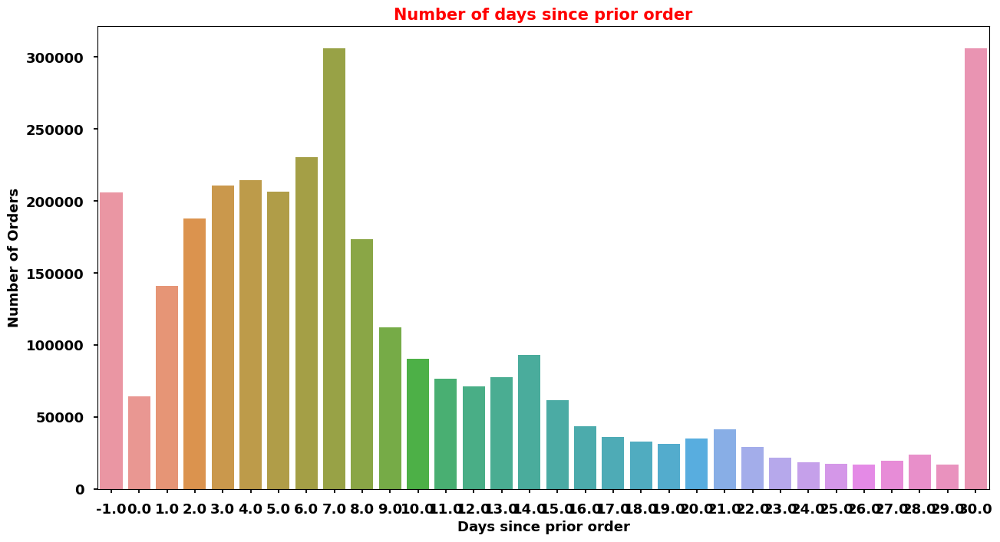

In [28]:
# Number of days since prior order
fig, ax = plt.subplots(dpi = 100, figsize=(15,8))
days_since_prior_order = market_basket[market_basket['days_since_prior_order'].notnull()][['order_id', 'days_since_prior_order']].drop_duplicates()
ax = sns.countplot(x = 'days_since_prior_order', data = days_since_prior_order)
ax.set_xlabel('Days since prior order', weight="bold", fontsize=13)
plt.ylabel("Number of Orders",weight= "bold", fontsize=13)
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.title("Number of days since prior order", weight="bold", c="red",fontsize=15)
plt.show()

## Number of Orders related

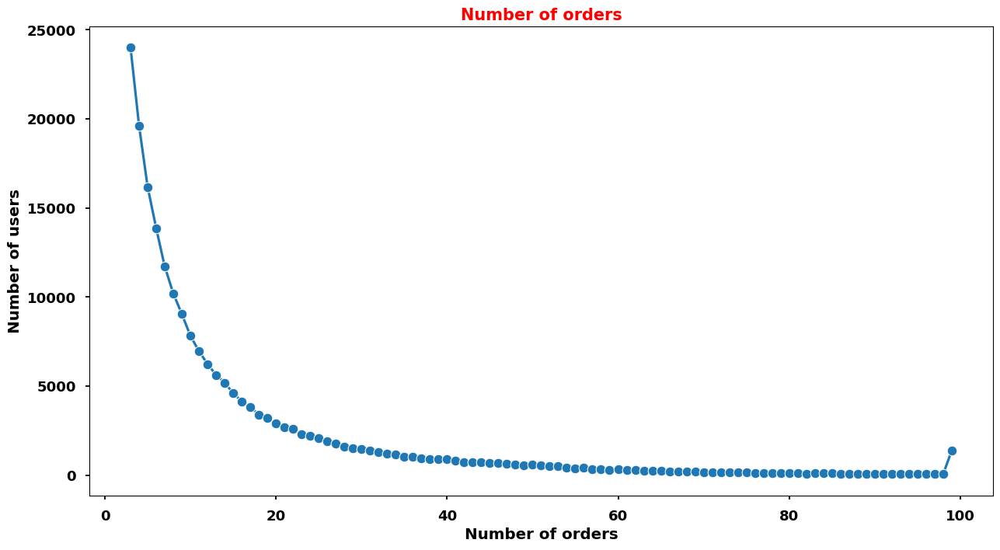

In [29]:
# Number of users for each number of total orders
fig, ax = plt.subplots(dpi = 100, figsize=(15,8))
num_order = market_basket.sort_values(['order_number']).drop_duplicates(['user_id'],keep='last')[['user_id', 'order_number']]
num_of_order = num_order.groupby('order_number').count()
sns.lineplot(x = 'order_number', y = 'user_id', data = num_of_order, marker = 'o')
plt.title("Number of orders",weight="bold", c="red",fontsize=15)
plt.ylabel("Number of users", weight="bold")
plt.xlabel("Number of orders",weight="bold")
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

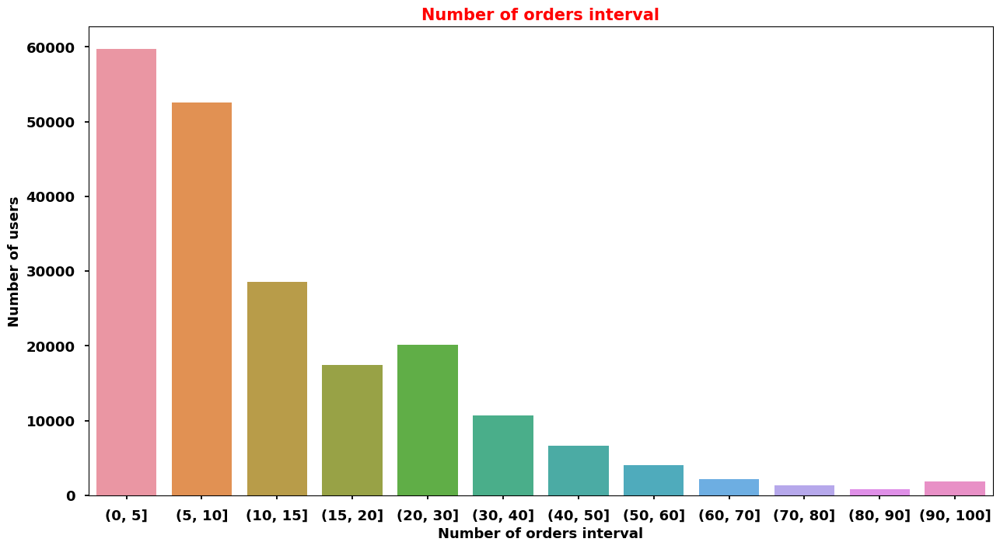

In [30]:
# Number of users for each number of total orders interval
fig, ax = plt.subplots(dpi = 100, figsize=(15,8))
order_num = market_basket.sort_values(['order_number']).drop_duplicates(['user_id'],keep='last')['order_number']
order_num_cut = pd.cut(order_num, bins = [0, 5, 10, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100], right = True).to_frame()
sns.countplot(x = 'order_number',data = order_num_cut)
plt.title("Number of orders interval",weight="bold", c="red",fontsize=15)
plt.ylabel("Number of users", weight="bold", fontsize=13)
plt.xlabel("Number of orders interval",weight="bold", fontsize=13)
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

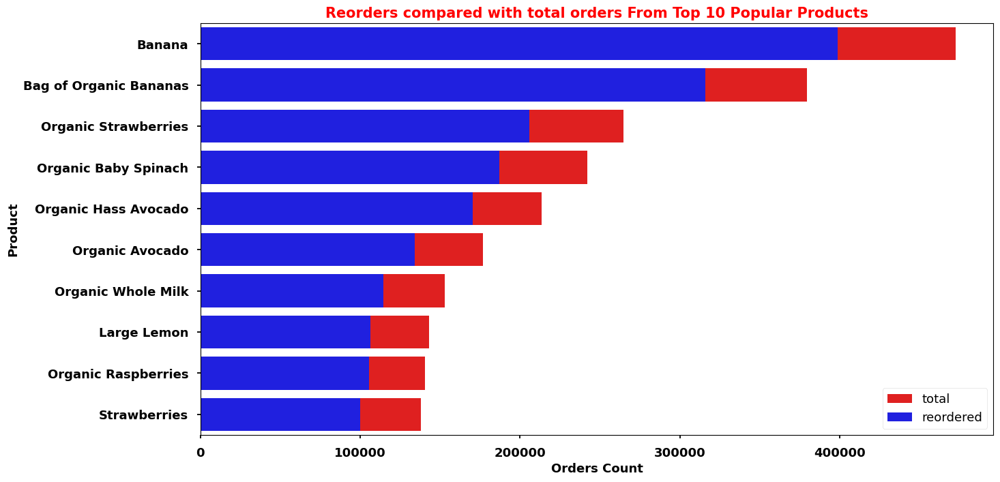

In [31]:
# Top 10 products which sell most and reorder most
fig, ax = plt.subplots(figsize=(15,8), dpi = 100)
order = market_basket[['order_id','product_name']].groupby('product_name').count().sort_values('order_id', ascending = False).head(10)
order = order.rename(columns = {'order_id':'count'}).reset_index()
reorder = market_basket[market_basket['reordered'] == 1][['order_id','product_name']].groupby('product_name').count().sort_values('order_id', ascending = False).head(10)
reorder = reorder.rename(columns = {'order_id':'count'}).reset_index()
sns.barplot(y = 'product_name', x = 'count', data = order, orient = 'h', color = 'r', label = 'total')
sns.barplot(y = 'product_name', x = 'count', data = reorder, orient = 'h', color = 'b', label = 'reordered')
plt.title("Reorders compared with total orders From Top 10 Popular Products",weight="bold", c="red",fontsize=15)
plt.ylabel("Product", weight="bold", fontsize=13)
plt.xlabel("Orders Count",weight="bold", fontsize=13)
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.legend(loc = 4)
plt.show()

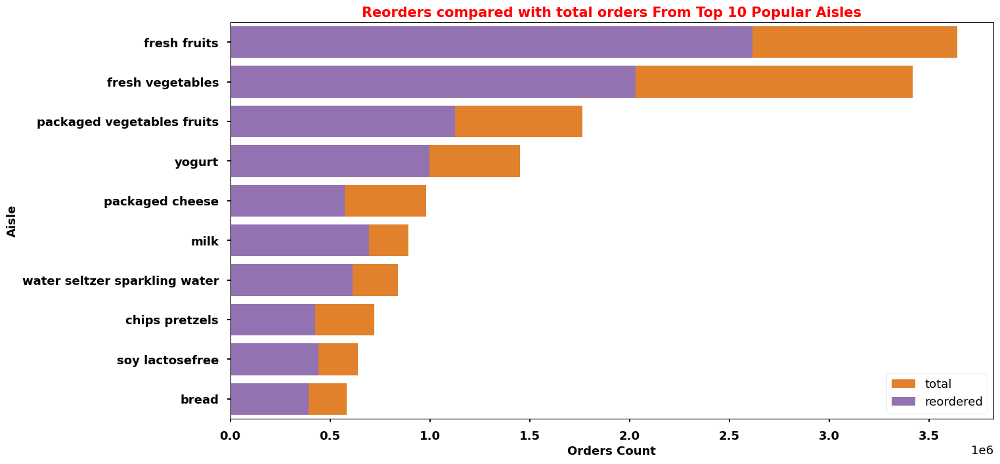

In [32]:
# Top 10 aisles which sell most and reorder most
temp_aisle = market_basket.groupby("aisle")["reordered"].agg(['count', 'sum']).rename(columns = {'count':'total','sum':'reorders'})
temp_aisle = temp_aisle.sort_values('total', ascending=False).reset_index()
fig, ax = plt.subplots(figsize = (15,8), dpi = 100)
color = sns.color_palette()
sns.barplot(y = temp_aisle.aisle[0:10], x = temp_aisle.total[0:20], color = color[1], label = "total")
sns.barplot(y = temp_aisle.aisle[0:10], x = temp_aisle.reorders[0:20], color = color[4], label = "reordered")
plt.title("Reorders compared with total orders From Top 10 Popular Aisles",weight="bold", c="red",fontsize=15)
plt.ylabel("Aisle", weight="bold", fontsize=13)
plt.xlabel("Orders Count",weight="bold", fontsize=13)
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.legend(loc = 4)
plt.show()

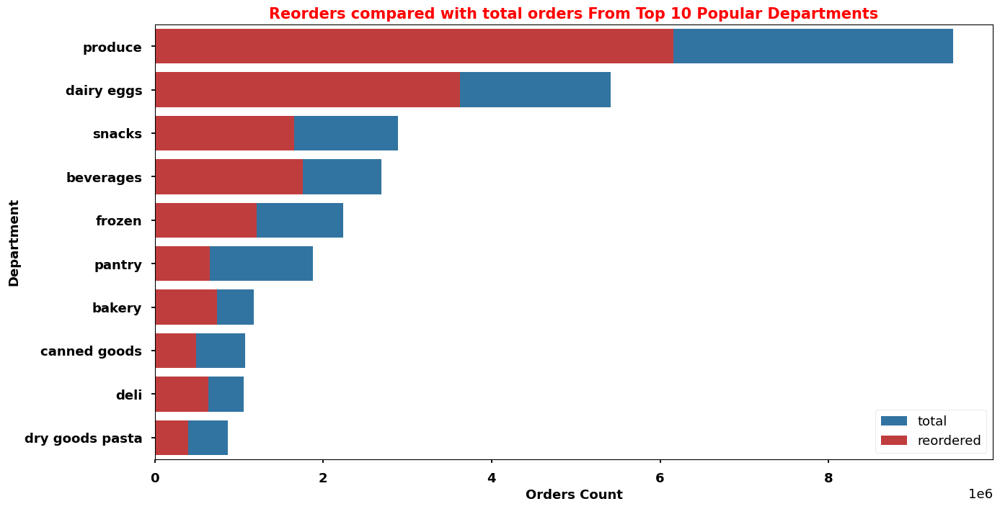

In [33]:
# Top 10 departments which sell most and reorder most
temp_dep = market_basket.groupby("department")["reordered"].agg(['count', 'sum']).rename(columns = {'count':'total','sum':'reorders'})
temp_dep = temp_dep.sort_values('total', ascending=False).reset_index()
fig, ax = plt.subplots(figsize = (15,8), dpi = 100)
color = sns.color_palette()
sns.barplot(y = temp_dep.department[0:10], x = temp_dep.total[0:20], color = color[0], label = "total")
sns.barplot(y = temp_dep.department[0:10], x = temp_dep.reorders[0:20], color = color[3], label = "reordered")
plt.title("Reorders compared with total orders From Top 10 Popular Departments",weight="bold", c="red",fontsize=15)
plt.ylabel("Department", weight="bold", fontsize=13)
plt.xlabel("Orders Count",weight="bold", fontsize=13)
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.legend(loc = 4)
plt.show()

## Reorder Ratio

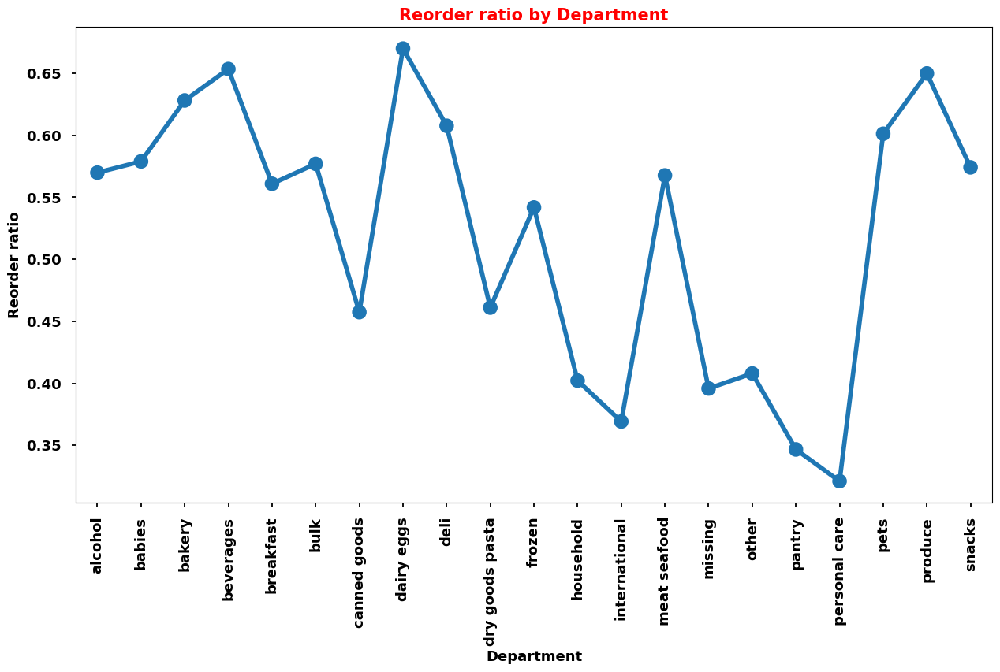

In [34]:
# Reorder percentage of each dept
grouped_df = market_basket.groupby(["department"])["reordered"].aggregate("mean").reset_index()

plt.figure(figsize=(15,8), dpi = 100)
sns.pointplot(grouped_df['department'].values, grouped_df['reordered'].values, alpha=0.8)
plt.ylabel('Reorder ratio', fontsize=13, weight="bold")
plt.xlabel('Department', fontsize=13, weight="bold")
plt.title("Reorder ratio by Department", weight="bold", c="red", fontsize=15)
plt.xticks(rotation='vertical')
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

# Personal care has lowest reorder ratio and dairy eggs have highest reorder ratio

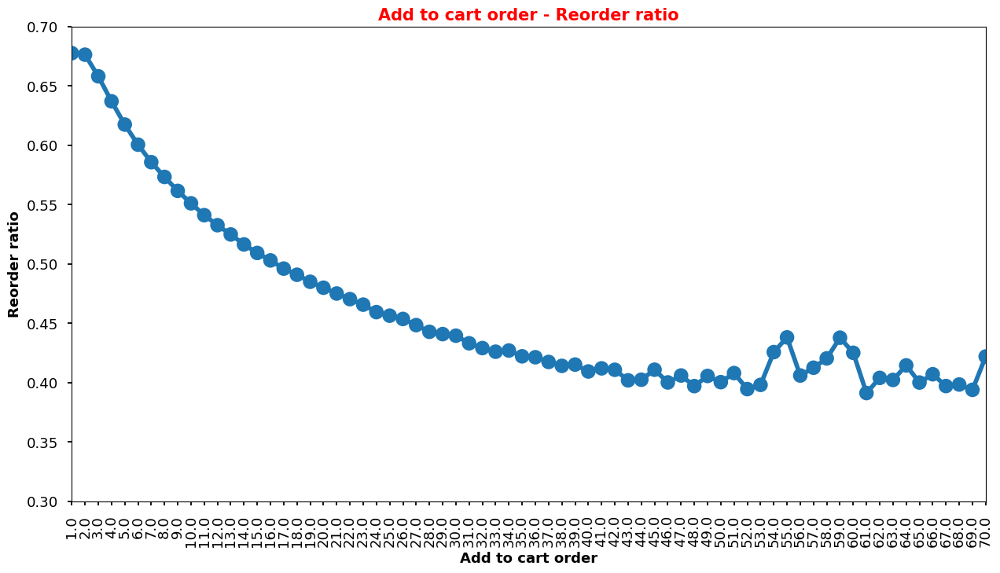

In [35]:
## Add to cart - reorder ratio
market_basket2 = market_basket.copy()
market_basket2["add_to_cart_order_mod"] = market_basket2["add_to_cart_order"].copy()
grouped_df = market_basket2.groupby(['add_to_cart_order_mod'])['reordered'].aggregate("mean").reset_index()

plt.figure(figsize=(15,8), dpi = 100)
sns.pointplot(grouped_df["add_to_cart_order_mod"].values,grouped_df['reordered'].values,alpha=0.8)
plt.xlabel("Add to cart order", fontsize=13, weight="bold")
plt.ylabel("Reorder ratio", fontsize=13, weight="bold")
plt.title("Add to cart order - Reorder ratio", fontsize=15, c="red", weight="bold")
plt.xticks(rotation="vertical")
plt.xlim(0,69)
plt.ylim(0.3,0.7)
plt.show()
# products that are added to the cart initially are more likely to be reordered again compared to the ones added later.

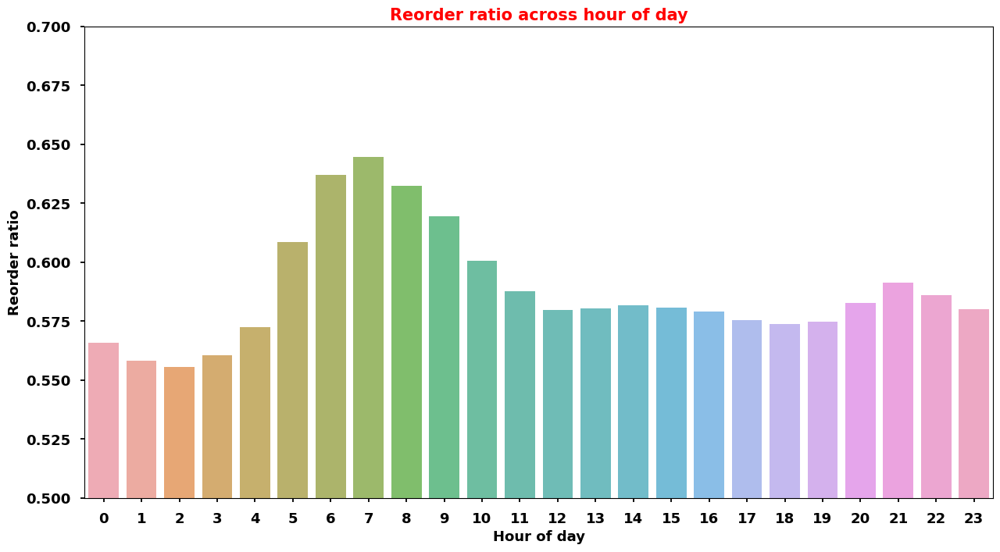

In [36]:
# Reorder ratio across hour of day
grouped_df2 = market_basket_all.groupby(["order_hour_of_day"])["reordered"].aggregate("mean").reset_index()
plt.figure(figsize=(15,8), dpi = 100)
sns.barplot(grouped_df2["order_hour_of_day"].values, grouped_df2["reordered"].values, alpha=0.8)
plt.xlabel("Hour of day", fontsize=13, weight="bold")
plt.ylabel("Reorder ratio", fontsize=13, weight="bold")
plt.title("Reorder ratio across hour of day", weight="bold", c="red", fontsize=15)
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.ylim(0.5,0.7)
plt.show()

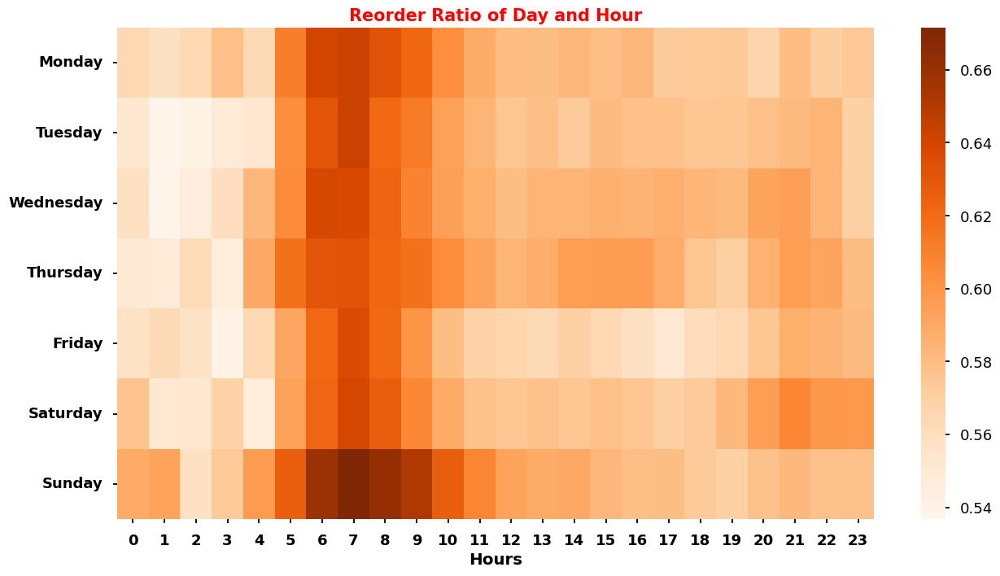

In [37]:
# Reorder Ratio of Day and Hour
cats = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
heatmap_reorder = market_basket.groupby(["order_dow", "order_hour_of_day"])["reordered"].aggregate("mean").reset_index()
heatmap_reorder = heatmap_reorder.pivot('order_dow', 'order_hour_of_day', 'reordered').reindex(cats)
plt.figure(figsize=(15,8), dpi = 100)
sns.heatmap(heatmap_reorder,cmap="Oranges")
plt.title("Reorder Ratio of Day and Hour", weight="bold", c="red", fontsize=15)
plt.ylabel("")
plt.xlabel("Hours",weight="bold")
plt.yticks(weight="bold")
plt.xticks(weight="bold")
plt.show()

# Customer segmentation

In [28]:
# use aisle to segment the customers, so we do a crosstab between user_id and aisles
cust_aisle = pd.crosstab(market_basket['user_id'], market_basket['aisle'])
cust_aisle.head(5)

aisle,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
user_id,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
2,0,3,0,0,0,0,2,0,0,0,...,3,1,1,0,0,0,0,2,0,42
3,0,0,0,0,0,0,0,0,0,0,...,4,1,0,0,0,0,0,2,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
5,0,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3


In [29]:
# apply PCA to do the dimension reduction since there are 134 columns
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(cust_aisle)

PCA()

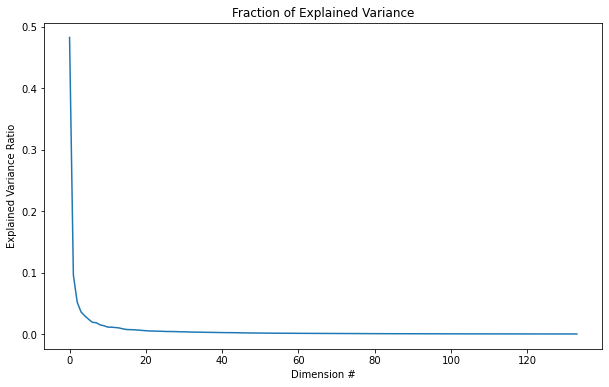

In [30]:
# draw the fraction of explained variance
fig, ax = plt.subplots(figsize=(10,6))
ax.set_xlabel('Dimension #')
ax.set_ylabel('Explained Variance Ratio')
ax.set_title('Fraction of Explained Variance')
ax.plot(pca.explained_variance_ratio_)
plt.show()

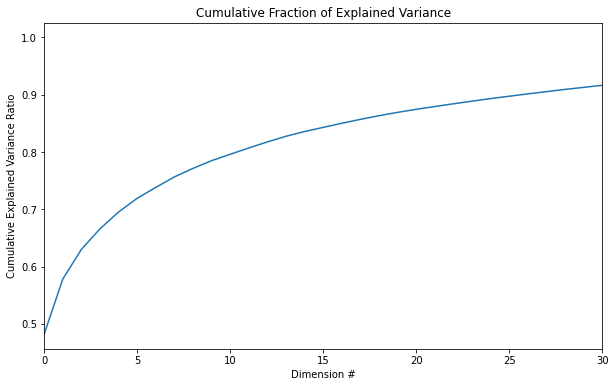

0.8071629834551421


In [31]:
# draw the cumulative fraction of explained variance
fig, ax = plt.subplots(figsize=(10,6))
ax.set_xlabel('Dimension #')
ax.set_ylabel('Cumulative Explained Variance Ratio')
ax.set_title('Cumulative Fraction of Explained Variance')
ax.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0, 30)
plt.show()

# when dimension = 12, cumulative explained variance ratio > 0.8
print(np.cumsum(pca.explained_variance_ratio_)[11])

In [32]:
# choose 12 dimensions to apply PCA
pca = PCA(n_components = 12)
reduced_cust_aisle = pca.fit_transform(cust_aisle)

In [33]:
# Apply KMeans to cluster our customers
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, n_init = 10, random_state = 0)
    kmeans.fit(reduced_cust_aisle)
    wcss.append(kmeans.inertia_)

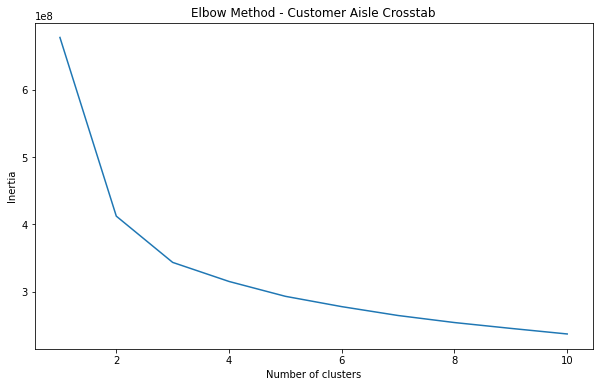

In [34]:
#Plotting the results onto a line graph to observe 'The elbow'
fig, ax = plt.subplots(figsize=(10,6))
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method - Customer Aisle Crosstab')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia') #within cluster sum of squares
plt.show()

In [40]:
kmeans = KMeans(n_clusters = 4, n_init = 10, random_state = 26)
labels = kmeans.fit_predict(reduced_cust_aisle)

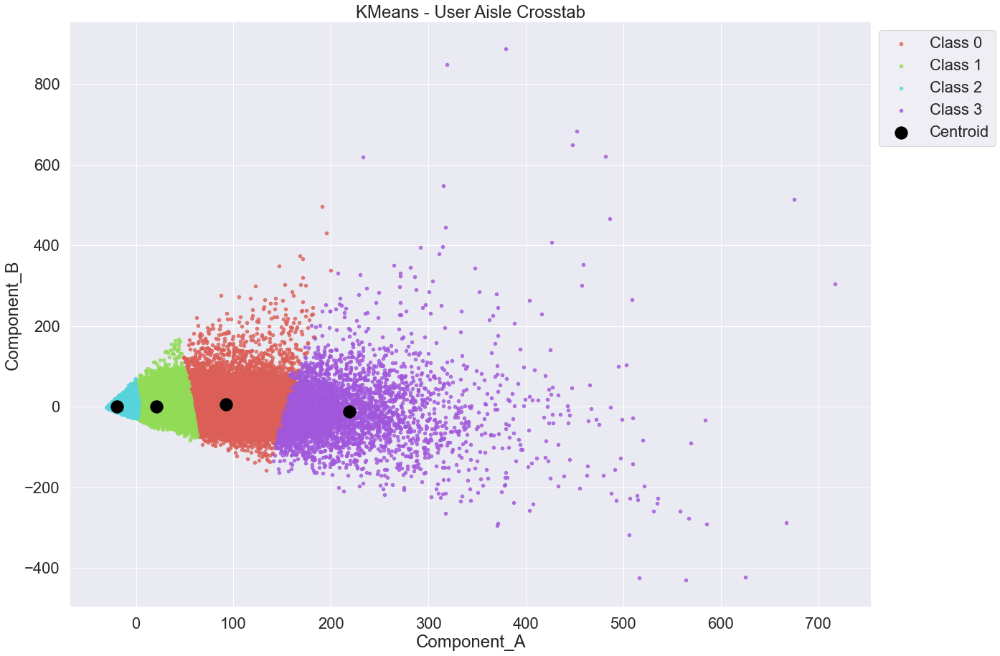

In [41]:
cols = ['Component_A', 'Component_B', 'Cluster']
# Get cluster labels and assign plotting colors/labels.
plbls = set(labels)
pclrs = sns.hls_palette(len(plbls))
pcls = ['Class {0}'.format(idx) for idx in plbls] # ['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4']
# Predicted Clusters
pc = pd.DataFrame(np.concatenate((reduced_user_aisle[:, [0,1]], labels.reshape((206209 , 1))), axis=1), columns = cols)
# Plot
sns.set(font_scale=2.0)
fig, ax = plt.subplots(figsize=(20, 15))
# Plot KMeans clusters
for idx in list(plbls):
    tmp_pdf = pc[pc['Cluster'] == idx]
    ax.scatter(tmp_pdf['Component_A'], tmp_pdf['Component_B'], color=pclrs[idx], label=pcls[idx], alpha=0.8, s = 20)
# Plotting the centroids of the clusters
ax.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1],  color = 'black', label = 'Centroid', alpha=1, s=300)
ax.set_xlabel('Component_A')
ax.set_ylabel('Component_B')
ax.set_title('KMeans - User Aisle Crosstab')
ax.legend(bbox_to_anchor=(1, 1), loc=2)
sns.despine(offset=5, trim=True)
sns.set(font_scale=1.0)

In [47]:
from sklearn.manifold import TSNE
model = TSNE(learning_rate = 252, perplexity = 12, random_state = 0)
tsne_features = model.fit_transform(reduced_user_aisle)

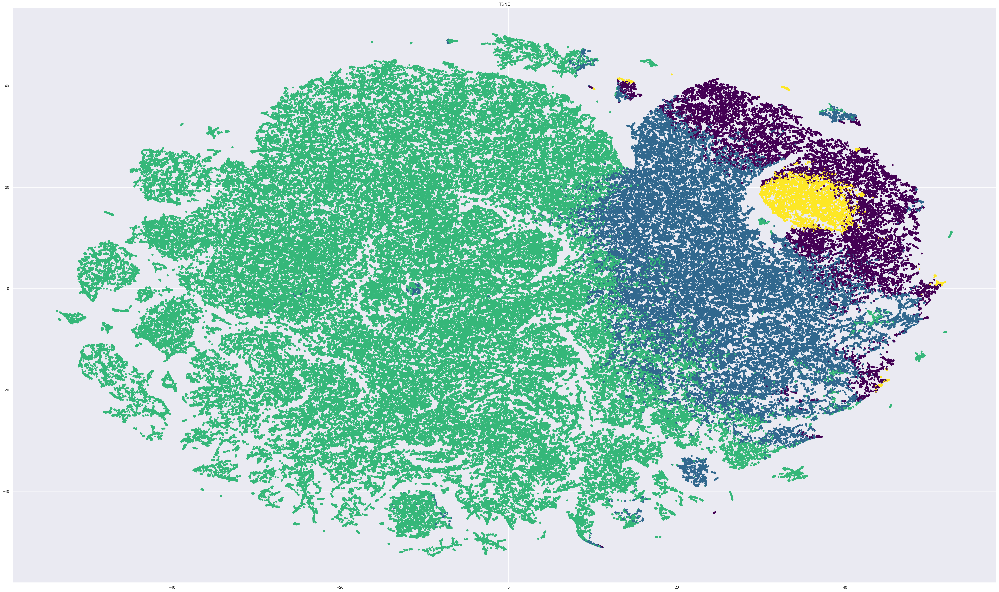

In [70]:
xs = tsne_features[:,0]
ys = tsne_features[:,1]
fig, ax = plt.subplots(figsize=(50, 30), dpi = 200)
plt.scatter(xs, ys, alpha = 1, s = 20, c = labels, cmap = 'viridis')
plt.title('TSNE')
plt.show()

In [99]:
label_name = pd.DataFrame(labels.reshape(206209 , 1))
label_name.columns = ['label']
cust_aisle = cust_aisle.reset_index()
cust_aisle_label = pd.concat([cust_aisle, label_name], axis = 1)
cust_aisle_label

,user_id,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,...,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt,label
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,2
1,2,0,3,0,0,0,0,2,0,0,...,1,1,0,0,0,0,2,0,42,1
2,3,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,2,0,0,2
3,4,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,2
4,5,0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206204,206205,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,5,2
206205,206206,0,4,0,0,0,0,4,1,0,...,0,0,0,0,1,0,1,0,0,2
206206,206207,0,0,0,0,1,0,0,0,0,...,4,0,2,1,0,0,11,0,15,1
206207,206208,0,3,0,0,3,0,4,0,0,...,0,0,7,0,0,0,0,0,33,0


In [118]:
# we can see that there is no big diffference of the aisles for these four groups
# but the number of things they bought is significantly different
cust_aisle_label_3 = pd.DataFrame(cust_aisle_label[cust_aisle_label['label'] == 3])
print(cust_aisle_label_3['user_id'].nunique())
cust_aisle_mean_3 = pd.DataFrame(cust_aisle_label_3.mean(), columns = ['mean']).iloc[1:135, :]
cust_aisle_mean_3.sort_values('mean', ascending = False).head(10)

3599


,mean
fresh fruits,155.518199
fresh vegetables,154.460128
packaged vegetables fruits,66.815504
yogurt,50.736871
packaged cheese,30.804112
milk,29.572659
soy lactosefree,19.549041
bread,18.066963
baby food formula,18.033343
chips pretzels,16.935816


In [119]:
# 
cust_aisle_label_0 = pd.DataFrame(cust_aisle_label[cust_aisle_label['label'] == 0])
print(cust_aisle_label_0['user_id'].nunique())
cust_aisle_mean_0 = pd.DataFrame(cust_aisle_label_0.mean(), columns = ['mean']).iloc[1:135, :]
cust_aisle_mean_0.sort_values('mean', ascending = False).head(10)

13465


,mean
fresh fruits,76.624879
fresh vegetables,67.720312
packaged vegetables fruits,34.483773
yogurt,30.196361
packaged cheese,17.948905
milk,17.143260
water seltzer sparkling water,13.031192
chips pretzels,11.785518
soy lactosefree,11.729892
bread,10.555291


In [120]:
# 
cust_aisle_label_1 = pd.DataFrame(cust_aisle_label[cust_aisle_label['label'] == 1])
print(cust_aisle_label_1['user_id'].nunique())
cust_aisle_mean_1 = pd.DataFrame(cust_aisle_label_1.mean(), columns = ['mean']).iloc[1:135, :]
cust_aisle_mean_1.sort_values('mean', ascending = False).head(10)

40206


,mean
fresh fruits,29.437596
fresh vegetables,29.020768
packaged vegetables fruits,14.769363
yogurt,11.845496
packaged cheese,8.036686
milk,7.063946
water seltzer sparkling water,6.757350
chips pretzels,5.915087
soy lactosefree,5.391757
refrigerated,4.748147


In [121]:
# 
cust_aisle_label_2 = pd.DataFrame(cust_aisle_label[cust_aisle_label['label'] == 2])
print(cust_aisle_label_2['user_id'].nunique())
cust_aisle_mean_2 = pd.DataFrame(cust_aisle_label_2.mean(), columns = ['mean']).iloc[1:135, :]
cust_aisle_mean_2.sort_values('mean', ascending = False).head(10)

148939


,mean
fresh fruits,5.822223
fresh vegetables,5.260247
packaged vegetables fruits,3.133518
yogurt,2.597621
water seltzer sparkling water,2.265122
packaged cheese,2.041735
milk,1.811050
chips pretzels,1.779279
ice cream ice,1.382942
soft drinks,1.315210


# Association rules

In [38]:
market_basket.head()

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,aisle,department,organic
0,2539329,1,prior,1,Monday,8,-1.0,196.0,1.0,0.0,Soda,77.0,7.0,soft drinks,beverages,0
1,2539329,1,prior,1,Monday,8,-1.0,14084.0,2.0,0.0,Organic Unsweetened Vanilla Almond Milk,91.0,16.0,soy lactosefree,dairy eggs,1
2,2539329,1,prior,1,Monday,8,-1.0,12427.0,3.0,0.0,Original Beef Jerky,23.0,19.0,popcorn jerky,snacks,0
3,2539329,1,prior,1,Monday,8,-1.0,26088.0,4.0,0.0,Aged White Cheddar Popcorn,23.0,19.0,popcorn jerky,snacks,0
4,2539329,1,prior,1,Monday,8,-1.0,26405.0,5.0,0.0,XL Pick-A-Size Paper Towel Rolls,54.0,17.0,paper goods,household,0


In [39]:
# Collect all unique product to one list for each order_id
user_product = market_basket.groupby('order_id',as_index=False).agg({'product_name':(lambda x: set(x))})
user_product

,order_id,product_name
0,2,"{Garlic Powder, Natural Sweetener, Carrots, Or..."
1,3,"{Organic Ezekiel 49 Bread Cinnamon Raisin, Uns..."
2,4,"{Honey/Lemon Cough Drops, Kellogg's Nutri-Grai..."
3,5,"{Bag of Organic Bananas, Matzos, Thin, Tea, Da..."
4,6,{Clean Day Lavender Scent Room Freshener Spray...
...,...,...
3214869,3421079,{Moisture Soap}
3214870,3421080,"{Organic Whole Milk, Organic Tomato Cluster, O..."
3214871,3421081,"{Hint of Lime Flavored Tortilla Chips, Classic..."
3214872,3421082,"{Strawberries, Special K Red Berries Cereal, F..."


In [40]:
# Applied Apriori Algorithm on the product list given base level of support, confidence, and lift value 
rules = apriori(list(user_product["product_name"]), support=0.008, confidence=0.1, lift=1.0)
print(rules)

<generator object apriori at 0x7fcde02b3270>


In [41]:
# sorted the frequent associations among sets of items in databases base on support, confidence, lift value
rules_sorted = sorted(rules, key=lambda x: (x[4], x[3], x[2]), reverse=True)

In [42]:
# print total frequent associations amount
len(rules_sorted)

36

In [43]:
rules_list=[]
for r in rules_sorted:
    rules_list.append([list(r[0])[0],list(r[1])[0],r[2],r[3],r[4]])

In [44]:
# print the dataframe of frequent associations and key metrics
df_rules=pd.DataFrame(rules_list)
df_rules.columns=["From","To","Support","Confidence","Lift"]

In [45]:
df_rules.head(10)

,From,To,Support,Confidence,Lift
0,Large Lemon,Limes,0.008524,0.179507,4.103710
1,Limes,Large Lemon,0.008524,0.194863,4.103710
2,Organic Raspberries,Organic Strawberries,0.010533,0.247072,3.000973
3,Organic Strawberries,Organic Raspberries,0.010533,0.127938,3.000973
4,Organic Hass Avocado,Organic Raspberries,0.008023,0.120763,2.832669
5,Organic Raspberries,Organic Hass Avocado,0.008023,0.188192,2.832669
6,Organic Fuji Apple,Banana,0.010558,0.378693,2.576259
7,Organic Raspberries,Bag of Organic Bananas,0.012599,0.295519,2.503775
8,Bag of Organic Bananas,Organic Raspberries,0.012599,0.106741,2.503775
9,Organic Hass Avocado,Bag of Organic Bananas,0.019391,0.291880,2.472945


In [46]:
G=nx.from_pandas_edgelist(df_rules,"From","To","Lift")

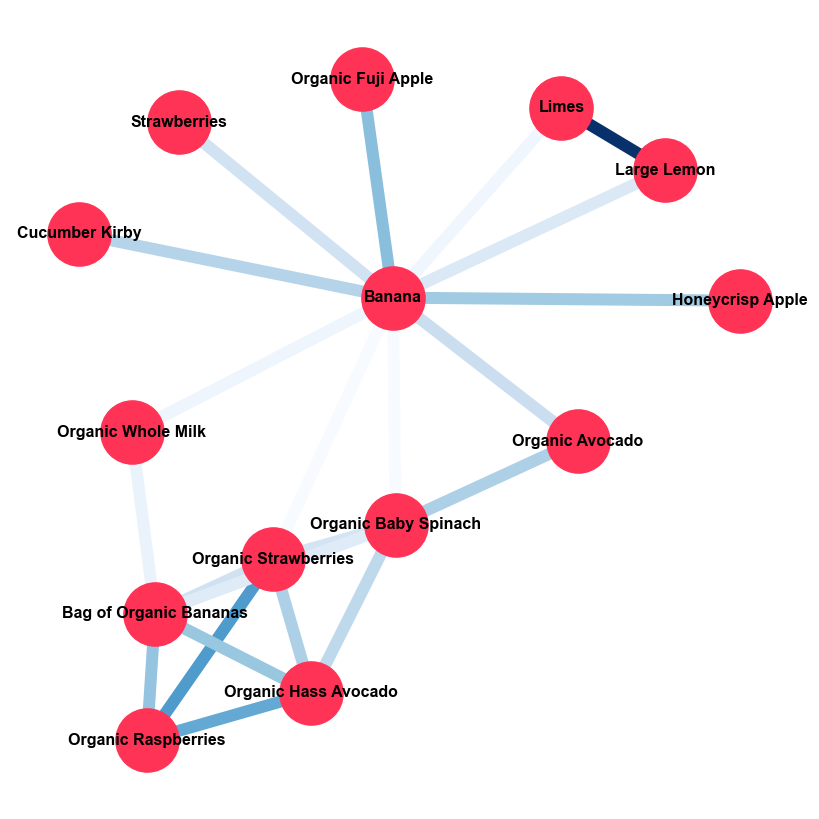

In [166]:
# draw the frequent associations graph to visualize the relationship among products
my_dpi=96
plt.figure(figsize=(800/my_dpi, 800/my_dpi), dpi=my_dpi,facecolor="lightslategray")

plt.facecolor="Black"
edges = G.edges()
colors = [G[u][v]['Lift'] for u,v in edges]
nx.draw(G,with_labels=True,node_color="#ff3355",node_size=2250,edge_color=colors, arrows=False,font_color="Black",font_weight="bold",font_size=12,style="solid",width=9,edge_cmap=plt.cm.Blues)


plt.savefig("nx.png",format="png" )
plt.show()

# Feature Engineering

In [122]:
# Extract the distinct train and test subsets' user id 
train_user = market_basket_all[market_basket_all['eval_set'] == 'train'][['user_id']].drop_duplicates()
test_user = market_basket_all[market_basket_all['eval_set'] == 'test'][['user_id']].drop_duplicates()

In [123]:
# Match the detailed information for those distinct train and test user_id
market_basket_train = pd.merge(train_user, market_basket, on = 'user_id', how = 'left')
market_basket_test = pd.merge(test_user, market_basket, on = 'user_id', how = 'left')

In [65]:
# market_basket_train.to_csv("MarketBasket_train.csv")
# market_basket_test.to_csv("MarketBasket_test.csv")

In [66]:
# market_basket_train = pd.read_csv("MarketBasket_train.csv")
# market_basket_test = pd.read_csv("MarketBasket_test.csv")

## Total number of orders

In [124]:
# For each user_id, extract their total numbers of order
total_order = market_basket_train.groupby(by='user_id')['order_number'].aggregate('max').to_frame('total_num_of_orders').reset_index()
total_order.head()

,user_id,total_num_of_orders
0,1,10
1,2,14
2,5,4
3,7,20
4,8,3


## Product ordered in last order

In [125]:
# 1 if given user reordered the given product in his/her last order otherwise 0
total_order.columns = ['user_id', 'order_number']
reordered_in_last_order = pd.merge(total_order, market_basket_train, on = ['user_id', 'order_number'], how = 'left')
reordered_in_last_order = reordered_in_last_order[['user_id', 'product_id']]
reordered_in_last_order['reordered_in_last_order'] = 1.0
reordered_in_last_order.head()

,user_id,product_id,reordered_in_last_order
0,1,196.0,1.0
1,1,46149.0,1.0
2,1,39657.0,1.0
3,1,38928.0,1.0
4,1,25133.0,1.0


## Average products per order

In [126]:
# For each user_id, extract the information o average products purchased among all of the orders
avg_product = market_basket_train.groupby(by=['user_id', 'order_id'])['product_id'].aggregate('count').to_frame('total_products_per_order').reset_index()
avg_product = avg_product.groupby(by=['user_id'])['total_products_per_order'].mean().to_frame('avg_product_per_order').reset_index()
avg_product.head(10)

,user_id,avg_product_per_order
0,1,5.900000
1,2,13.928571
2,5,9.250000
3,7,10.300000
4,8,16.333333
5,9,25.333333
6,10,28.600000
7,13,6.750000
8,14,16.153846
9,17,7.350000


## Product total counts

In [127]:
# counts how many times each product is purchased 
product_total_count = market_basket_train.groupby(by='product_id')['order_id'].agg('count').to_frame('product_total_count').reset_index()
product_total_count.head()

,product_id,product_total_count
0,1.0,1202
1,2.0,60
2,3.0,193
3,4.0,218
4,5.0,12


## Product reorder ratio

In [128]:
#products product reorder ratio.
product_reorder_ratio = market_basket_train.groupby(by='product_id')['reordered'].agg('mean').to_frame('product_reorder_ratio').reset_index()
product_reorder_ratio.head()

,product_id,product_reorder_ratio
0,1.0,0.627288
1,2.0,0.166667
2,3.0,0.756477
3,4.0,0.477064
4,5.0,0.666667


## Aisle reorder ratio

In [133]:
aisle_reorder_ratio = market_basket_train.groupby(by='aisle_id')['reordered'].agg('mean').to_frame('aisle_reorder_ratio').reset_index()
aisle_reorder_ratio = pd.merge(aisle_reorder_ratio,market_basket_train, on='aisle_id', how ='left')
aisle_reorder_ratio = aisle_reorder_ratio[['product_id','aisle_reorder_ratio']].drop_duplicates()
aisle_reorder_ratio.head()

,product_id,aisle_reorder_ratio
0,28874.0,0.591688
1,25199.0,0.591688
2,23719.0,0.591688
3,20874.0,0.591688
5,29180.0,0.591688


## Department reorder ratio

In [134]:
department_reorder_ratio = market_basket_train.groupby(by='department_id')['reordered'].agg('mean').to_frame('department_reorder_ratio').reset_index()
department_reorder_ratio = pd.merge(department_reorder_ratio,market_basket_train, on='department_id', how ='left')
department_reorder_ratio = department_reorder_ratio[['product_id','department_reorder_ratio']].drop_duplicates()
department_reorder_ratio.head()

,product_id,department_reorder_ratio
0,45613.0,0.541834
1,9681.0,0.541834
2,21150.0,0.541834
4,2002.0,0.541834
6,48099.0,0.541834


## The number of times the user bought a certain product

In [129]:
# get the number of times the user bought a certain product
user_product_count = market_basket_train.groupby(by=['user_id', 'product_id'])['order_id'].agg('count').to_frame('user_product_count').reset_index()
user_product_count.head()

,user_id,product_id,user_product_count
0,1,196.0,10
1,1,10258.0,9
2,1,10326.0,1
3,1,12427.0,10
4,1,13032.0,3


## Average add_to_cart position

In [130]:
# calculate what is the position for each products user adds into cart
avg_addtoorder_all = market_basket_train.groupby(by=['user_id','product_id'])['add_to_cart_order'].mean().to_frame('avg_add_to_cart_pos').reset_index()
avg_addtoorder_all.head()

,user_id,product_id,avg_add_to_cart_pos
0,1,196.0,1.400000
1,1,10258.0,3.333333
2,1,10326.0,5.000000
3,1,12427.0,3.300000
4,1,13032.0,6.333333


## Average days since prior order

In [131]:
# count how many days user will rebuy a product
prior_order_cumsum = market_basket_train[['user_id', 'product_id', 'order_number', 'days_since_prior_order']].sort_values(['user_id', 'product_id', 'order_number'])
prior_order_cumsum['cum_sum'] = prior_order_cumsum.groupby(['user_id', 'product_id'])['days_since_prior_order'].cumsum()
min_max = prior_order_cumsum.groupby(['user_id', 'product_id'])['cum_sum'].agg(['min', 'max']).reset_index()
avg_day_since_prior_order = prior_order_cumsum.groupby(['user_id', 'product_id'])['order_number'].agg('count').to_frame('order_number_count').reset_index()

merge = pd.merge(avg_day_since_prior_order,min_max, on = ['user_id','product_id'], how = 'left')
merge['range'] = merge['max'] - merge['min']
merge['avg_days_since_priororder'] = merge['range'] / (merge['order_number_count'] - 1)

merge['avg_days_since_priororder']= merge['avg_days_since_priororder'].fillna(-1)
#-1 -- count==1， first time purchase and only purchased this once
avg_days_since_priororder = merge[['user_id', 'product_id', 'avg_days_since_priororder']]
avg_days_since_priororder.head()

,user_id,product_id,avg_days_since_priororder
0,1,196.0,19.555556
1,1,10258.0,20.125000
2,1,10326.0,-1.000000
3,1,12427.0,19.555556
4,1,13032.0,25.000000


## Is Organic or not

In [132]:
# 1 for organic, 0 for non-organic
organic = market_basket_train[['product_id', 'product_name']].drop_duplicates()
organic['is_organic'] = organic['product_name'].str.contains('Organic').astype(int)
organic = organic.drop(['product_name'], axis = 1)
organic.head()

,product_id,is_organic
0,196.0,0
1,14084.0,1
2,12427.0,0
3,26088.0,0
4,26405.0,0


## Department weight index

In [135]:
# Count by deparment count number
dep = market_basket_train.groupby(by='department')['department_id'].agg('count').to_frame('department_count').reset_index()
dep  = dep.sort_values('department_count',ascending = False).set_index('department')
dep['department_index'] = range(0, len(dep))
department_order = pd.merge(market_basket_train, dep, on='department', how ='left')
department_count = department_order[['product_id','department_index']].drop_duplicates()
department_count.head()

,product_id,department_index
0,196.0,3
1,14084.0,1
2,12427.0,2
3,26088.0,2
4,26405.0,10


## Complie all features together

In [136]:
# Select user_id and product_id to merge the independent variable 
df3 = market_basket_train[['user_id', 'product_id']].drop_duplicates()
# merge total number of orders
df3 = pd.merge(df3, total_order, on='user_id', how ='left')
# merge averge products per order
df3 = pd.merge(df3, avg_product, on='user_id', how ='left')
# merge product total counts
df3 = pd.merge(df3, product_total_count, on='product_id', how ='left')
# merge product reorder ratio
df3 = pd.merge(df3, product_reorder_ratio, on='product_id', how ='left')
# merge aisle reorder ratio
df3 = pd.merge(df3, aisle_reorder_ratio, on='product_id', how ='left')
# merge department reorder ratio
df3 = pd.merge(df3, department_reorder_ratio, on='product_id', how ='left')
# merge The number of times the user bought a certain product
df3 = pd.merge(df3, user_product_count, on=['user_id','product_id'], how ='left')
# merge average add_to_cart position
df3 = pd.merge(df3, avg_addtoorder_all, on=['user_id','product_id'], how ='left')
# merge Average days since prior order
df3 = pd.merge(df3, avg_days_since_priororder, on = ['user_id','product_id'], how = 'left')
# merge organic to our feature table
df3 = pd.merge(df3, organic, on = ['product_id'], how = 'left')
# merge deparment index
df3 = pd.merge(df3, department_count, on = 'product_id', how = 'left')
# merge product ordered in last order
df3 = pd.merge(df3, reordered_in_last_order, on = ['user_id','product_id'], how = 'left')

In [137]:
# select the information of user_id, product_id, reordered as explanatory variable
train = market_basket_all[market_basket_all['eval_set'] == 'train'][['user_id','product_id','reordered']]

In [138]:
# merge those above 7 independent variable and explanatory variable of reordered, 1 count for reorder, 0 count for not reorder
df3 = pd.merge(df3, train, on=['user_id','product_id'], how ='left')
df3['reordered'] = df3['reordered'].fillna(0)
df3['reordered_in_last_order'] = df3['reordered_in_last_order'].fillna(0)

In [157]:
df3.head(10)

,user_id,product_id,order_number,avg_product_per_order,product_total_count,product_reorder_ratio,aisle_reorder_ratio,department_reorder_ratio,user_product_count,avg_add_to_cart_pos,avg_days_since_priororder,is_organic,department_index,reordered_in_last_order,reordered
0,1,196.0,10,5.9,22920,0.778403,0.639082,0.654107,10,1.400000,19.555556,0,3,1.0,1.0
1,1,14084.0,10,5.9,10244,0.812280,0.691128,0.670183,1,2.000000,-1.000000,1,1,0.0,0.0
2,1,12427.0,10,5.9,4008,0.741517,0.590795,0.573399,10,3.300000,19.555556,0,2,1.0,0.0
3,1,26088.0,10,5.9,1551,0.537718,0.590795,0.573399,2,4.500000,15.000000,0,2,0.0,1.0
4,1,26405.0,10,5.9,812,0.465517,0.527463,0.401268,2,5.000000,29.000000,0,10,0.0,1.0
5,1,10258.0,10,5.9,1303,0.716040,0.520317,0.573399,9,3.333333,20.125000,0,2,1.0,1.0
6,1,13176.0,10,5.9,239739,0.831095,0.717708,0.649622,2,6.000000,28.000000,1,0,0.0,0.0
7,1,13032.0,10,5.9,2455,0.655804,0.571153,0.560594,3,6.333333,25.000000,0,11,1.0,1.0
8,1,25133.0,10,5.9,3589,0.726386,0.585377,0.670183,8,4.000000,20.000000,1,1,1.0,1.0
9,1,30450.0,10,5.9,13637,0.566840,0.486935,0.346080,1,5.000000,-1.000000,0,5,0.0,0.0


In [158]:
# count the reorder vs not-reorder ratio
df3['reordered'].value_counts()

0.0    7645837
1.0     828824
Name: reordered, dtype: int64

In [159]:
df3['reordered'].value_counts(normalize = True) 

0.0    0.9022
1.0    0.0978
Name: reordered, dtype: float64

In [107]:
#Saving result data frame as a csv File
# df3.to_csv("modelingdata.csv")

In [108]:
#Reading market basket initial from csv File as a data frame
# df3 = pd.read_csv("modelingdata.csv")

# Modeling

## Sampling

In [160]:
from sklearn.model_selection import train_test_split

X = df3.drop(['reordered'], axis=1)
y = df3['reordered']

In [161]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline


Since our classifier ratio is around 9:1, it is imbalanced. We need to transfer it into balanced form. We first applied SMOTE techniques for the minoriority class of reorder, then undersampled the majority class of not-reorder.

In [162]:
over = SMOTE(sampling_strategy=0.2)
under = RandomUnderSampler(sampling_strategy=0.6)
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)
# transform the dataset
X, y = pipeline.fit_resample(X, y)

In [163]:
y.value_counts()

0.0    2548611
1.0    1529167
Name: reordered, dtype: int64

In [164]:
y.value_counts(normalize = True) 

0.0    0.625
1.0    0.375
Name: reordered, dtype: float64

In [171]:
# set user_id and product_id as index for the models
X = X.set_index(['user_id', 'product_id'])
X.head(5)

,,order_number,avg_product_per_order,product_total_count,product_reorder_ratio,aisle_reorder_ratio,department_reorder_ratio,user_product_count,avg_add_to_cart_pos,avg_days_since_priororder,is_organic,department_index,reordered_in_last_order
user_id,product_id,,,,,,,,,,,,
149283,27845.0,35,5.200000,87888,0.831433,0.781333,0.670183,15,3.266667,8.928571,1,1,0.0
190243,30169.0,49,10.387755,10363,0.687446,0.688288,0.670183,5,8.800000,11.500000,0,1,0.0
184189,16004.0,15,8.133333,528,0.553030,0.585377,0.670183,1,4.000000,-1.000000,0,1,0.0
145001,31717.0,39,9.923077,44505,0.622155,0.518388,0.649622,1,10.000000,-1.000000,1,0,0.0
112292,5550.0,63,12.730159,5538,0.697544,0.688288,0.670183,2,10.500000,2.000000,0,1,0.0


In this way our data is balanced right now, the ratio is around 5:3.

In [172]:
x_train, x_val, y_train, y_val = train_test_split(X,y, stratify = y, test_size = 0.25, random_state = 128)

## Logistic Regression

In [183]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score,roc_auc_score,log_loss

logreg = LogisticRegression()
logreg.fit(x_train, y_train)
y_pred_lr = logreg.predict(x_val)

acc_lr = round(accuracy_score(y_pred_lr, y_val)*100,2)
pre_lr = round(precision_score(y_val, y_pred_lr)*100,2)
rec_lr = round(recall_score(y_val, y_pred_lr)*100,2)
f1_lr = round(f1_score(y_val, y_pred_lr)*100,2)
roc_lr = round(roc_auc_score(y_val, y_pred_lr)*100,2)
ll_lr = round(log_loss(y_val,y_pred_lr),4)
print("Accuracy Score: ",acc_lr)
print("Precision Score: ",pre_lr)
print("Recall Score: ", rec_lr)
print("f1_score Score: ",f1_lr)
print("Roc_auc_score Score: ",roc_lr)
print("Log-Loss Score: ", ll_lr)

Accuracy Score:  73.04
Precision Score:  68.48
Recall Score:  52.09
f1_score Score:  59.17
Roc_auc_score Score:  68.85
Log-Loss Score:  9.3109


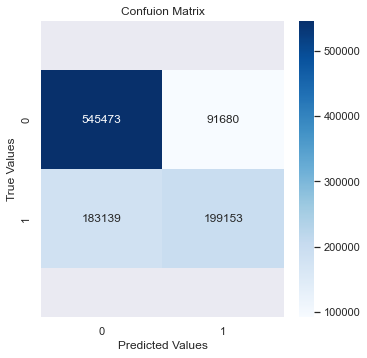

In [184]:
from sklearn.metrics import confusion_matrix, accuracy_score
#confusion matrix
conf_matrix = confusion_matrix(y_val,y_pred_lr)
plt.figure(figsize=(12,12))
plt.subplot(221)
sns.heatmap(conf_matrix, fmt = "d",annot=True, cmap='Blues')
b, t = plt.ylim()
plt.ylim(b + 0.5, t - 0.5)
plt.title('Confuion Matrix')
plt.ylabel('True Values')
plt.xlabel('Predicted Values')
plt.show()

## Gaussian Naive Bayes

In [185]:
# Gaussian Naive Bayes
from sklearn.naive_bayes import GaussianNB

gaussian = GaussianNB()
gaussian.fit(x_train, y_train)
y_pred_gnb = gaussian.predict(x_val)

acc_gnb = round(accuracy_score(y_pred_gnb, y_val)*100,2)
pre_gnb = round(precision_score(y_val, y_pred_gnb)*100,2)
rec_gnb = round(recall_score(y_val, y_pred_gnb)*100,2)
f1_gnb = round(f1_score(y_val, y_pred_gnb)*100,2)
roc_gnb = round(roc_auc_score(y_val, y_pred_gnb)*100,2)
ll_gnb = round(log_loss(y_val,y_pred_gnb),4)
print("Accuracy Score: ",acc_gnb)
print("Precision Score: ",pre_gnb)
print("Recall Score: ", rec_gnb)
print("f1_score Score: ",f1_gnb)
print("Roc_auc_score Score: ",roc_gnb)
print("Log-Loss Score: ", ll_gnb)

Accuracy Score:  70.33
Precision Score:  66.96
Recall Score:  41.24
f1_score Score:  51.04
Roc_auc_score Score:  64.52
Log-Loss Score:  10.2466


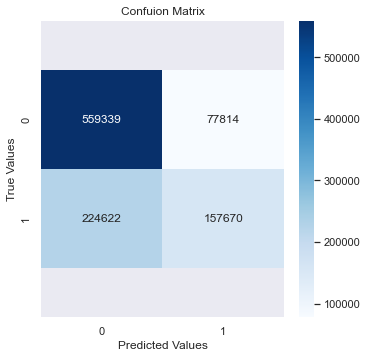

In [186]:
conf_matrix = confusion_matrix(y_val,y_pred_gnb)
plt.figure(figsize=(12,12))
plt.subplot(221)
sns.heatmap(conf_matrix, fmt = "d",annot=True, cmap='Blues')
b, t = plt.ylim()
plt.ylim(b + 0.5, t - 0.5)
plt.title('Confuion Matrix')
plt.ylabel('True Values')
plt.xlabel('Predicted Values')
plt.show()

## Decision Tree

In [187]:
#Decision Tree
from sklearn.tree import DecisionTreeClassifier

decisiontree = DecisionTreeClassifier()
decisiontree.fit(x_train, y_train)
y_pred_dt = decisiontree.predict(x_val)

acc_dt = round(accuracy_score(y_pred_dt, y_val)*100,2)
pre_dt = round(precision_score(y_val, y_pred_dt)*100,2)
rec_dt = round(recall_score(y_val, y_pred_dt)*100,2)
f1_dt = round(f1_score(y_val, y_pred_dt)*100,2)
roc_dt = round(roc_auc_score(y_val, y_pred_dt)*100,2)
ll_dt = round(log_loss(y_val,y_pred_dt),4)
print("Accuracy Score: ",acc_dt)
print("Precision Score: ",pre_dt)
print("Recall Score: ", rec_dt)
print("f1_score Score: ",f1_dt)
print("Roc_auc_score Score: ",roc_dt)
print("Log-Loss Score: ", ll_dt)

Accuracy Score:  74.36
Precision Score:  65.58
Recall Score:  66.57
f1_score Score:  66.07
Roc_auc_score Score:  72.8
Log-Loss Score:  8.8559


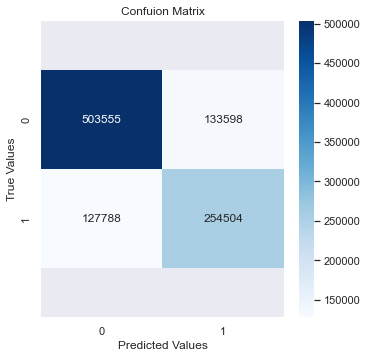

In [188]:
conf_matrix = confusion_matrix(y_val,y_pred_dt)
plt.figure(figsize=(12,12))
plt.subplot(221)
sns.heatmap(conf_matrix, fmt = "d",annot=True, cmap='Blues')
b, t = plt.ylim()
plt.ylim(b + 0.5, t - 0.5)
plt.title('Confuion Matrix')
plt.ylabel('True Values')
plt.xlabel('Predicted Values')
plt.show()

## KNN or k-Nearest Neighbors

In [189]:
# KNN or k-Nearest Neighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score
knn = KNeighborsClassifier()
knn.fit(x_train, y_train)
y_pred_knn = knn.predict(x_val)

acc_knn = round(accuracy_score(y_pred_knn, y_val)*100,2)
pre_knn = round(precision_score(y_val, y_pred_knn)*100,2)
rec_knn = round(recall_score(y_val, y_pred_knn)*100,2)
f1_knn = round(f1_score(y_val, y_pred_knn)*100,2)
roc_knn = round(roc_auc_score(y_val, y_pred_knn)*100,2)
ll_knn = round(log_loss(y_val,y_pred_knn),4)
print("Accuracy Score: ",acc_knn)
print("Precision Score: ",pre_knn)
print("Recall Score: ", rec_knn)
print("f1_score Score: ",f1_knn)
print("Roc_auc_score Score: ",roc_knn)
print("Log-Loss Score: ", ll_knn)

Accuracy Score:  72.85
Precision Score:  65.92
Recall Score:  57.12
f1_score Score:  61.21
Roc_auc_score Score:  69.7
Log-Loss Score:  9.379


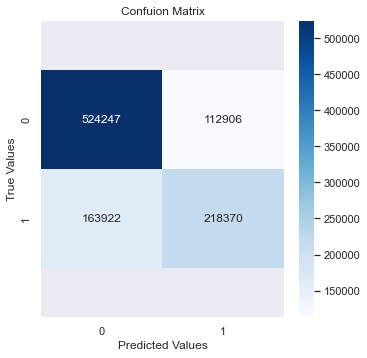

In [190]:
conf_matrix = confusion_matrix(y_val,y_pred_knn)
plt.figure(figsize=(12,12))
plt.subplot(221)
sns.heatmap(conf_matrix, fmt = "d",annot=True, cmap='Blues')
b, t = plt.ylim()
plt.ylim(b + 0.5, t - 0.5)
plt.title('Confuion Matrix')
plt.ylabel('True Values')
plt.xlabel('Predicted Values')
plt.show()

## Stochastic Gradient Descent

In [191]:
# Stochastic Gradient Descent
from sklearn.linear_model import SGDClassifier

sgd = SGDClassifier()
sgd.fit(x_train, y_train)
y_pred_sgd = sgd.predict(x_val)

acc_sgd = round(accuracy_score(y_pred_sgd, y_val)*100,2)
pre_sgd = round(precision_score(y_val, y_pred_sgd)*100,2)
rec_sgd = round(recall_score(y_val, y_pred_sgd)*100,2)
f1_sgd = round(f1_score(y_val, y_pred_sgd)*100,2)
roc_sgd = round(roc_auc_score(y_val, y_pred_sgd)*100,2)
ll_sgd = round(log_loss(y_val,y_pred_sgd),4)
print("Accuracy Score: ",acc_sgd)
print("Precision Score: ",pre_sgd)
print("Recall Score: ", rec_sgd)
print("f1_score Score: ",f1_sgd)
print("Roc_auc_score Score: ",roc_sgd)
print("Log-Loss Score: ", ll_sgd)

Accuracy Score:  65.11
Precision Score:  52.72
Recall Score:  67.48
f1_score Score:  59.19
Roc_auc_score Score:  65.59
Log-Loss Score:  12.0491


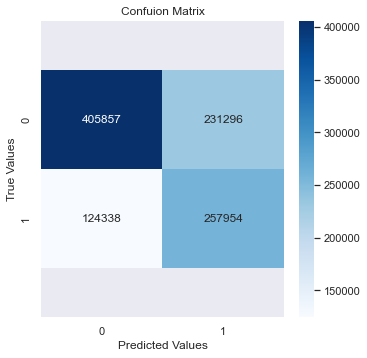

In [192]:
conf_matrix = confusion_matrix(y_val,y_pred_sgd)
plt.figure(figsize=(12,12))
plt.subplot(221)
sns.heatmap(conf_matrix, fmt = "d",annot=True, cmap='Blues')
b, t = plt.ylim()
plt.ylim(b + 0.5, t - 0.5)
plt.title('Confuion Matrix')
plt.ylabel('True Values')
plt.xlabel('Predicted Values')
plt.show()

## Random Forest

In [281]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(max_depth = 6)
rfc.fit(x_train, y_train)
y_pred_rfc = rfc.predict(x_val)

acc_rfc = round(accuracy_score(y_pred_rfc, y_val)*100,2)
pre_rfc = round(precision_score(y_val, y_pred_rfc)*100,2)
rec_rfc = round(recall_score(y_val, y_pred_rfc)*100,2)
f1_rfc = round(f1_score(y_val, y_pred_rfc)*100,2)
roc_rfc = round(roc_auc_score(y_val, y_pred_rfc)*100,2)
ll_rfc = round(log_loss(y_val,y_pred_rfc),4)
print("Accuracy Score: ",acc_rfc)
print("Precision Score: ",pre_rfc)
print("Recall Score: ", rec_rfc)
print("f1_score Score: ",f1_rfc)
print("Roc_auc_score Score: ",roc_rfc)
print("Log-Loss Score: ", ll_rfc)

Accuracy Score:  79.91
Precision Score:  81.31
Recall Score:  60.29
f1_score Score:  69.24
Roc_auc_score Score:  75.99
Log-Loss Score:  6.9383


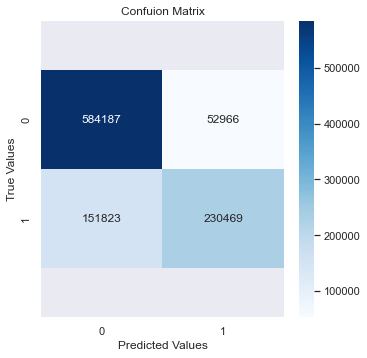

In [288]:
conf_matrix = confusion_matrix(y_val,y_pred_rfc)
plt.figure(figsize=(12,12))
plt.subplot(221)
sns.heatmap(conf_matrix, fmt = "d",annot=True, cmap='Blues')
b, t = plt.ylim()
plt.ylim(b + 0.5, t - 0.5)
plt.title('Confuion Matrix')
plt.ylabel('True Values')
plt.xlabel('Predicted Values')
plt.show()

## Gradient Boosting Classifier

In [193]:
# Gradient Boosting Classifier
from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier()
gbc.fit(x_train, y_train)
y_pred_gbc = gbc.predict(x_val)

acc_gbc = round(accuracy_score(y_pred_gbc, y_val)*100,2)
pre_gbc = round(precision_score(y_val, y_pred_gbc)*100,2)
rec_gbc = round(recall_score(y_val, y_pred_gbc)*100,2)
f1_gbc = round(f1_score(y_val, y_pred_gbc)*100,2)
roc_gbc = round(roc_auc_score(y_val, y_pred_gbc)*100,2)
ll_gbc = round(log_loss(y_val,y_pred_gbc),4)
print("Accuracy Score: ",acc_gbc)
print("Precision Score: ",pre_gbc)
print("Recall Score: ", rec_gbc)
print("f1_score Score: ",f1_gbc)
print("Roc_auc_score Score: ",roc_gbc)
print("Log-Loss Score: ", ll_gbc)

Accuracy Score:  81.0
Precision Score:  80.72
Recall Score:  64.8
f1_score Score:  71.89
Roc_auc_score Score:  77.76
Log-Loss Score:  6.5641


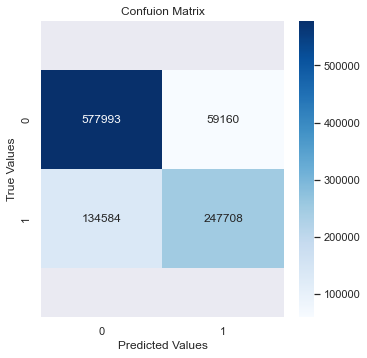

In [194]:
conf_matrix = confusion_matrix(y_val,y_pred_gbc)
plt.figure(figsize=(12,12))
plt.subplot(221)
sns.heatmap(conf_matrix, fmt = "d",annot=True, cmap='Blues')
b, t = plt.ylim()
plt.ylim(b + 0.5, t - 0.5)
plt.title('Confuion Matrix')
plt.ylabel('True Values')
plt.xlabel('Predicted Values')
plt.show()

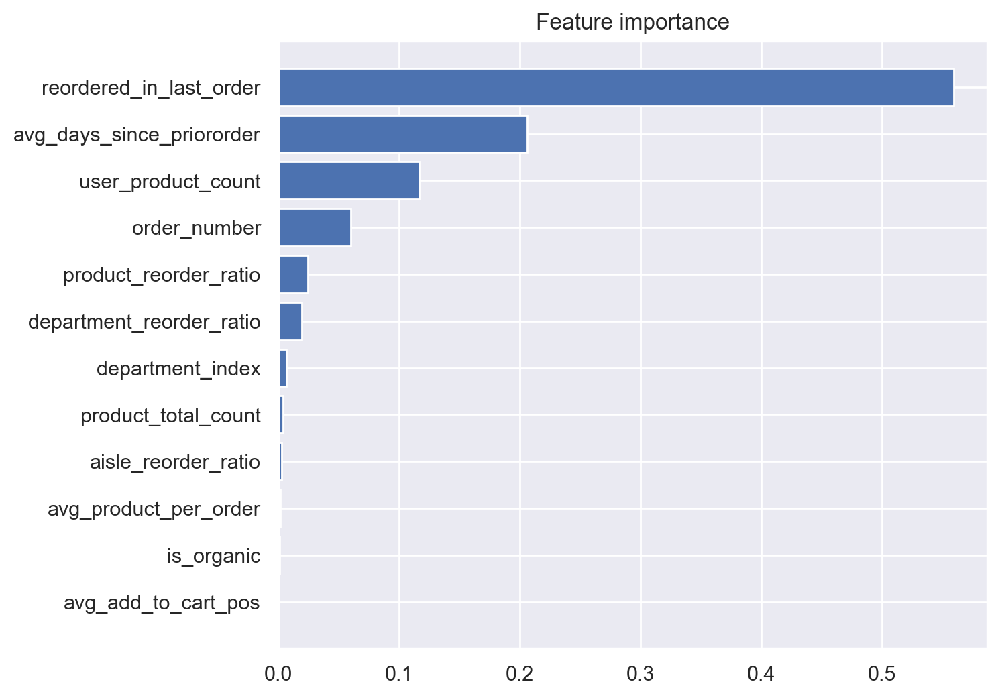

In [203]:
feature_importance = gbc.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(15, 6), dpi = 200)
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
plt.yticks(pos, np.array(X.columns)[sorted_idx])
plt.title("Feature importance")
plt.show()

In [284]:
# Choose Gradient Boosting Classifier as final model
# tune the parameters

from sklearn.model_selection import GridSearchCV

# Create a range of values for different parameters
param_grid = {
    'max_depth': [3,4,5],
    'learning_rate': [0.05, 0.1, 0.15],
    'n_estimators': [50, 100, 150]
}

gbc = GradientBoostingClassifier()

grid_search = GridSearchCV(estimator = gbc, n_jobs=-1,  param_grid = param_grid, cv = 5)
grid_search.fit(x_train, y_train)
print("The best parameters are: ",  grid_search.best_params_)

The best parameters are:  {'learning_rate': 0.15, 'max_depth': 5, 'n_estimators': 150}


In [287]:
best_gbc = grid_search.best_estimator_
best_y_pred_gbc = best_gbc.predict(x_val)

acc_gbc = round(accuracy_score(best_y_pred_gbc, y_val)*100,2)
pre_gbc = round(precision_score(y_val, best_y_pred_gbc)*100,2)
rec_gbc = round(recall_score(y_val, best_y_pred_gbc)*100,2)
f1_gbc = round(f1_score(y_val, best_y_pred_gbc)*100,2)
roc_gbc = round(roc_auc_score(y_val, best_y_pred_gbc)*100,2)
ll_gbc = round(log_loss(y_val,best_y_pred_gbc),4)
print("Accuracy Score: ",acc_gbc)
print("Precision Score: ",pre_gbc)
print("Recall Score: ", rec_gbc)
print("f1_score Score: ",f1_gbc)
print("Roc_auc_score Score: ",roc_gbc)
print("Log-Loss Score: ", ll_gbc)

Accuracy Score:  82.89
Precision Score:  83.67
Recall Score:  67.55
f1_score Score:  74.75
Roc_auc_score Score:  79.82
Log-Loss Score:  5.9105


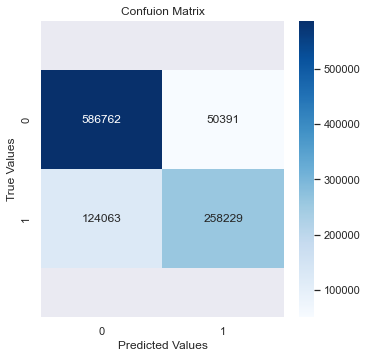

In [289]:
conf_matrix = confusion_matrix(y_val,best_y_pred_gbc)
plt.figure(figsize=(12,12))
plt.subplot(221)
sns.heatmap(conf_matrix, fmt = "d",annot=True, cmap='Blues')
b, t = plt.ylim()
plt.ylim(b + 0.5, t - 0.5)
plt.title('Confuion Matrix')
plt.ylabel('True Values')
plt.xlabel('Predicted Values')
plt.show()

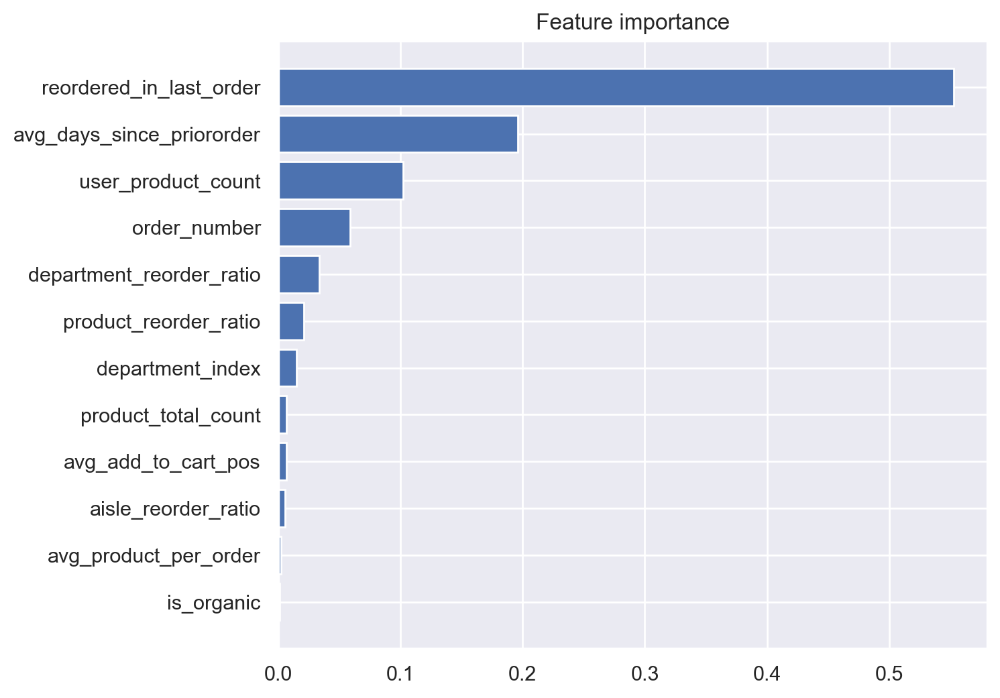

In [290]:
feature_importance = best_gbc.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(15, 6), dpi = 200)
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
plt.yticks(pos, np.array(X.columns)[sorted_idx])
plt.title("Feature importance")
plt.show()

## Prediction

In [204]:
# same feature engineering process as the train dataset
# Total number of orders
total_order = market_basket_test.groupby(by='user_id')['order_number'].aggregate('max').to_frame('total_num_of_orders').reset_index()

# Product ordered in last order
total_order.columns = ['user_id', 'order_number']
reordered_in_last_order = pd.merge(total_order, market_basket_test, on = ['user_id', 'order_number'], how = 'left')
reordered_in_last_order = reordered_in_last_order[['user_id', 'product_id']]
reordered_in_last_order['reordered_in_last_order'] = 1.0

# Average products per order
avg_product = market_basket_test.groupby(by=['user_id', 'order_id'])['product_id'].aggregate('count').to_frame('total_products_per_order').reset_index()
avg_product = avg_product.groupby(by=['user_id'])['total_products_per_order'].mean().to_frame('avg_product_per_order').reset_index()

# Product total counts
product_total_count = market_basket_test.groupby(by='product_id')['order_id'].agg('count').to_frame('product_total_count').reset_index()

# Product reorder ratio
product_reorder_ratio = market_basket_test.groupby(by='product_id')['reordered'].agg('mean').to_frame('product_reorder_ratio').reset_index()

# Aisle reorder ratio
aisle_reorder_ratio = market_basket_test.groupby(by='aisle_id')['reordered'].agg('mean').to_frame('aisle_reorder_ratio').reset_index()
aisle_reorder_ratio = pd.merge(aisle_reorder_ratio,market_basket_test, on='aisle_id', how ='left')
aisle_reorder_ratio = aisle_reorder_ratio[['product_id','aisle_reorder_ratio']].drop_duplicates()

# Department reorder ratio
department_reorder_ratio = market_basket_test.groupby(by='department_id')['reordered'].agg('mean').to_frame('department_reorder_ratio').reset_index()
department_reorder_ratio = pd.merge(department_reorder_ratio,market_basket_test, on='department_id', how ='left')
department_reorder_ratio = department_reorder_ratio[['product_id','department_reorder_ratio']].drop_duplicates()

# Department weight index
dep = market_basket_test.groupby(by='department')['department_id'].agg('count').to_frame('department_count').reset_index()
dep  = dep.sort_values('department_count',ascending = False).set_index('department')
dep['department_index'] = range(0, len(dep))
department_order = pd.merge(market_basket_test, dep, on='department', how ='left')
department_count = department_order[['product_id','department_index']].drop_duplicates()

# The number of times the user bought a certain product
user_product_count = market_basket_test.groupby(by=['user_id', 'product_id'])['order_id'].agg('count').to_frame('user_product_count').reset_index()

# Average add_to_cart position
avg_addtoorder_all = market_basket_test.groupby(by=['user_id','product_id'])['add_to_cart_order'].mean().to_frame('avg_add_to_cart_pos').reset_index()

# Average days since prior order
prior_order_cumsum = market_basket_test[['user_id', 'product_id', 'order_number', 'days_since_prior_order']].sort_values(['user_id', 'product_id', 'order_number'])
prior_order_cumsum['cum_sum'] = prior_order_cumsum.groupby(['user_id', 'product_id'])['days_since_prior_order'].cumsum()
min_max = prior_order_cumsum.groupby(['user_id', 'product_id'])['cum_sum'].agg(['min', 'max']).reset_index()
avg_day_since_prior_order = prior_order_cumsum.groupby(['user_id', 'product_id'])['order_number'].agg('count').to_frame('order_number_count').reset_index()
merge = pd.merge(avg_day_since_prior_order,min_max, on = ['user_id','product_id'], how = 'left')
merge['range'] = merge['max'] - merge['min']
merge['avg_days_since_priororder'] = merge['range'] / (merge['order_number_count'] - 1)
merge['avg_days_since_priororder']= merge['avg_days_since_priororder'].fillna(-1)
avg_days_since_priororder = merge[['user_id', 'product_id', 'avg_days_since_priororder']]

# Is Organic or not
organic = market_basket_test[['product_id', 'product_name']].drop_duplicates()
organic['is_organic'] = organic['product_name'].str.contains('Organic').astype(int)
organic = organic.drop(['product_name'], axis = 1)

In [220]:
# same merge process as the train dataset
test = market_basket_test[['user_id', 'product_id']].drop_duplicates()
test = pd.merge(test, total_order, on='user_id', how ='left')
test = pd.merge(test, avg_product, on='user_id', how ='left')
test = pd.merge(test, product_total_count, on='product_id', how ='left')
test = pd.merge(test, product_reorder_ratio, on='product_id', how ='left')
test = pd.merge(test, aisle_reorder_ratio, on='product_id', how ='left')
test = pd.merge(test, department_reorder_ratio, on='product_id', how ='left')
test = pd.merge(test, user_product_count, on=['user_id','product_id'], how ='left')
test = pd.merge(test, avg_addtoorder_all, on=['user_id','product_id'], how ='left')
test = pd.merge(test, avg_days_since_priororder, on = ['user_id','product_id'], how = 'left')
test = pd.merge(test, organic, on = ['product_id'], how = 'left')
test = pd.merge(test, department_count, on = 'product_id', how = 'left')
test = pd.merge(test, reordered_in_last_order, on = ['user_id','product_id'], how = 'left')

# fill null values
test['reordered_in_last_order'] = test['reordered_in_last_order'].fillna(0)

# set user_id and product_id as index
test = test.set_index(['user_id', 'product_id'])
test.head(5)

In [302]:
# apply the Gradient Boosting Classifier
test_predict = gbc.predict(test)

In [296]:
test['predict'] = test_predict

In [303]:
# ratio between 0 and 1
test['predict'].value_counts(normalize = True) 

0.0    0.834247
1.0    0.165753
Name: predict, dtype: float64

In [273]:
user3034 = test_final[test_final['user_id'] == 3034]

In [274]:
test_final = test.reset_index()

# randomly choose a user and see the prediction result for the next order
user3034 = test_final[test_final['user_id'] == 3034]
user3034

,user_id,product_id,order_number,avg_product_per_order,product_total_count,product_reorder_ratio,aisle_reorder_ratio,department_reorder_ratio,user_product_count,avg_add_to_cart_pos,avg_days_since_priororder,is_organic,department_index,reordered_in_last_order,predict
70430,3034,2002.0,4,7.5,1036,0.550193,0.541439,0.541977,3,2.333333,5.500000,0,4,0.0,1.0
70431,3034,40545.0,4,7.5,5200,0.575577,0.541801,0.541977,2,1.500000,5.000000,0,4,0.0,0.0
70432,3034,28934.0,4,7.5,5812,0.624570,0.541801,0.541977,4,4.250000,5.333333,0,4,1.0,1.0
70433,3034,35911.0,4,7.5,176,0.488636,0.550246,0.629906,2,4.500000,5.000000,0,6,0.0,1.0
70434,3034,32052.0,4,7.5,1549,0.544222,0.567737,0.575531,1,5.000000,-1.000000,1,2,0.0,0.0
70435,3034,25890.0,4,7.5,18210,0.660461,0.601592,0.570349,2,4.000000,5.000000,0,11,1.0,1.0
70436,3034,4461.0,4,7.5,3027,0.274199,0.353861,0.347843,1,1.000000,-1.000000,1,5,0.0,0.0
70437,3034,46035.0,4,7.5,27,0.296296,0.541439,0.541977,1,3.000000,-1.000000,1,4,0.0,0.0
70438,3034,36766.0,4,7.5,516,0.534884,0.554844,0.541977,1,4.000000,-1.000000,0,4,0.0,0.0
70439,3034,17902.0,4,7.5,2495,0.696192,0.705814,0.669591,2,3.500000,5.000000,0,1,1.0,1.0


In [275]:
# in this case, we predict user3034's 5th order
pd.merge(user3034[['user_id', 'product_id', 'predict']], products[['product_id', 'product_name']], on = 'product_id',  how = 'left')

,user_id,product_id,predict,product_name
0,3034,2002.0,1.0,"The \""World's Best\"" Veggie Burger"
1,3034,40545.0,0.0,Berry Medley
2,3034,28934.0,1.0,Frozen Broccoli Florets
3,3034,35911.0,1.0,Whole Wheat Flour Tortilla
4,3034,32052.0,0.0,Organic Brown Rice Cake Salt-Free
5,3034,25890.0,1.0,Boneless Skinless Chicken Breasts
6,3034,4461.0,0.0,Organic Raw Unfiltered Apple Cider Vinegar
7,3034,46035.0,0.0,Organic Shiitake Mushroom Meatless Burger 3 Count
8,3034,36766.0,0.0,Chicken Biryani
9,3034,17902.0,1.0,Liquid Egg Whites
